Data-Analytics-Coursework-1- Sayed Sohail (220541549)

# Clustering of Football Players Similar to 'Kylian Mbappé' using K-means and GMM Algorithms

<a id='sectionintro'></a>

## <a id='import_libraries'>Introduction</a>
The aim of this notebook is to cluster the aggregated football performance data of Top 5 European Leagues ( Premier League in England, the Bundesliga in Germany, La Liga in Spain, Serie A in Italy, and Ligue 1 in France) across 2018-19 to 2022-2023 (5 seasons) to find players similar to 'Kylian Mbappé'. The aggregated player performance data has been obtained from FBref (https://fbref.com/en/). The notebook uses Pandas for data manipulation through DataFrames, Matplotlib abdn Seaborn for data visualtisations, Scikit-Learn for Machine Learning (K-means and GMM).

<a id='contents'></a>
## <a id='notebook_contents'>Index</a>
1. [Dependencies](#section1)<br/>
2. [Data Scraping](#section2)<br/>
3. [Exploratory Data Analysis](#section3)<br>
    3.1 [Creating Profiler Report for the scraped data](#section3.1)<br/>
    3.2 [Checking Quality of dataset using head() and tail() methods](#section3.2)<br/>
    3.3 [Checking Shape returns a tuple representing the dimensionality of the DataFrame](#section3.3)<br/>
    3.4 [Identifying Column Names of the Data Frame](#section3.4)<br/>
    3.5 [Identifying Data Types of each Column](#section3.5)<br/>
    3.6 [Summary Statistics for each column in the dataset](#section3.6)<br/>
    3.7 [Checking For Null or Missing Values](#section3.7)<br/>
4. [Data Pre-Processing](#section4)<br/>
    4.1 [Creating a data frame to store names of all the teams in Top 5 European Leagues](#section4.1)<br/>
    4.2 [Removing Special Characters and Lower Casing Player Names](#section4.2)<br/>
    4.3 [String Cleaning: Mapping Countries obtained from CSV to Player Nationality in the dataset](#section4.3)<br/>
    4.4 [String Cleaning: Cleaning League names in the dataset](#section4.4)<br/>
    4.5 [ Grouping Player Positions and Defining a grouped position](#section4.5)<br/>
    4.6 [Converting Data Types](#section4.6)<br>
    4.7 [Creating Per 90 Stats](#section4.7)<br>
    4.8 [Subset Data of only Forwards with at least 10 Matches](#section4.8)<br>
    4.9 [Selecting Numerical and String Columns of Interest](#section4.9)<br>
    4.10 [Data Normalisation](#section4.10)<br>
    4.11 [Dimentionality Reduction using PCA](#section4.11)<br>
5. [Learning Methods](#section5)<br>
    5.1 [K-Means](#section5.1)<br>
    5.1.1 [Determining Elbow](#section5.1.1)<br>
    5.1.2 [Silhouette Score to determine optimal number of clusters](#section5.1.2)<br>
    5.1.3 [Clustering the Data using K-Means](#section5.1.3)<br>
    5.1.4 [Data Visualisation](#section5.1.4)<br>
    5.2 [GMM](#section5.2)<br>
    5.2.1 [Determining Optimal Number of Clusters using BIC and AIC](#section5.2.1)<br/>
    5.2.2 [Clustering Data using GMM](#section5.2.2)<br/>
    5.2.3 [Data Visualisation](#section5.2.3)<br/>
6. [Comparing K-means and GMM](#section6)<br/>
7. [Analysis](#section7)<br/>
    7.1 [Analysing Kylian Mbappe's performance over past 5 seasons](#section7.1)<br/>
    7.2 [Closest Performing players in last 5 seasons](#section7.2)<br/>
    7.3 [Closest Performing players for 22/23 season](#section7.3)<br/>
    7.4 [Closest Performing Young Players(u23) for 22/23 season](#section7.4)<br/>
8. [Conclusion](#section8)<br/>
9. [Future Improvements or Directions](#section9)<br/>
        
    
    


<a id='section1'></a>

## <a id='#section1'>1. Dependencies</a>

### Import Libraries and Modules

In [4]:
# Python ≥3.5 (ideally)
import platform
import sys, getopt
assert sys.version_info >= (3, 5)
import csv

!{sys.executable} -m pip install html5lib
# Import Dependencies
%matplotlib inline

# Math Operations
import numpy as np
from math import pi

# Datetime
import datetime
from datetime import date
import time

# Data Preprocessing
import pandas as pd
import ydata_profiling as pp
import os
import re
import random
import glob
from io import BytesIO
from pathlib import Path

# Reading directories
import glob
import os

# Working with JSON
import json
from pandas.io.json import json_normalize

# Web Scraping
import requests
from bs4 import BeautifulSoup
import re


# Machine Learning
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture as GMM
from sklearn.metrics import silhouette_score,silhouette_samples
from sklearn.metrics import davies_bouldin_score,calinski_harabasz_score

# Data Visualisation
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
plt.style.use('seaborn-whitegrid')
import missingno as msno

# Progress Bar
from tqdm import tqdm

# Display in Jupyter
from IPython.display import Image, YouTubeVideo
from IPython.core.display import HTML

# Ignore Warnings
import warnings
warnings.filterwarnings(action="ignore", message="^internal gelsd")


from soccerplots.radar_chart import Radar   # for custom radar visuals
print('Setup Complete')

Setup Complete


### Defining Filepaths and Variables

In [5]:
# Set up initial paths to subfolders
# base_dir = os.path.join('..', '..')
base_dir = os.getcwd()
data_dir = os.path.join(base_dir, 'data')
data_dir_fbref = os.path.join(base_dir, 'data', 'fbref')
img_dir = os.path.join(base_dir, 'img')
fig_dir = os.path.join(base_dir, 'img', 'fig')
video_dir = os.path.join(base_dir, 'video')
today = datetime.datetime.now().strftime('%d/%m/%Y').replace('/', '')
print(data_dir_fbref)


/Users/sayedsohail/QMUL/SEM-B/Data Analytics/Project/Coursework1/data/fbref


<a id='section2'></a>

## <a id='#section1'>2. Data Scraping</a>

The data needed for analysing aggregated player performance has been scraped from FBref (https://fbref.com/). The FBref dataset has over 5,264 outfield players for the last five seasons for the 'Big 5' European leagues.

### Selecting the various performance stats to be scraped from the FBref Web Pages

In [6]:
#@title

#standard(stats)
stats = ["player","nationality","position","team","comp_level","age","birth_year","games","games_starts","minutes","goals","assists","pens_made","pens_att","cards_yellow","cards_red","goals_per90","assists_per90","goals_assists_per90","goals_pens_per90","goals_assists_pens_per90","xg","npxg","xa","xg_per90","xa_per90","xg_xa_per90","npxg_per90","npxg_xa_per90"]
stats3 = ["players_used","possession","games","games_starts","minutes","goals","assists","pens_made","pens_att","cards_yellow","cards_red","goals_per90","assists_per90","goals_assists_per90","goals_pens_per90","goals_assists_pens_per90","xg","npxg","xa","xg_per90","xa_per90","xg_xa_per90","npxg_per90","npxg_xa_per90"] 
#goalkeeping(keepers)
keepers = ["player","nationality","position","squad","age","birth_year","games_gk","games_starts_gk","minutes_gk","goals_against_gk","goals_against_per90_gk","shots_on_target_against","saves","save_pct","wins_gk","draws_gk","losses_gk","clean_sheets","clean_sheets_pct","pens_att_gk","pens_allowed","pens_saved","pens_missed_gk"]
keepers3 = ["players_used","games_gk","games_starts_gk","minutes_gk","goals_against_gk","goals_against_per90_gk","shots_on_target_against","saves","save_pct","wins_gk","draws_gk","losses_gk","clean_sheets","clean_sheets_pct","pens_att_gk","pens_allowed","pens_saved","pens_missed_gk"]
#advance goalkeeping(keepersadv)
keepersadv = ["player","nationality","position","squad","age","birth_year","minutes_90s","goals_against_gk","pens_allowed","free_kick_goals_against_gk","corner_kick_goals_against_gk","own_goals_against_gk","psxg_gk","psnpxg_per_shot_on_target_against","psxg_net_gk","psxg_net_per90_gk","passes_completed_launched_gk","passes_launched_gk","passes_pct_launched_gk","passes_gk","passes_throws_gk","pct_passes_launched_gk","passes_length_avg_gk","goal_kicks","pct_goal_kicks_launched","goal_kick_length_avg","crosses_gk","crosses_stopped_gk","crosses_stopped_pct_gk","def_actions_outside_pen_area_gk","def_actions_outside_pen_area_per90_gk","avg_distance_def_actions_gk"]
keepersadv2 = ["minutes_90s","goals_against_gk","pens_allowed","free_kick_goals_against_gk","corner_kick_goals_against_gk","own_goals_against_gk","psxg_gk","psnpxg_per_shot_on_target_against","psxg_net_gk","psxg_net_per90_gk","passes_completed_launched_gk","passes_launched_gk","passes_pct_launched_gk","passes_gk","passes_throws_gk","pct_passes_launched_gk","passes_length_avg_gk","goal_kicks","pct_goal_kicks_launched","goal_kick_length_avg","crosses_gk","crosses_stopped_gk","crosses_stopped_pct_gk","def_actions_outside_pen_area_gk","def_actions_outside_pen_area_per90_gk","avg_distance_def_actions_gk"]
#shooting(shooting)
shooting = ["player","nationality","position","squad","age","birth_year","minutes_90s","goals","pens_made","pens_att","shots_total","shots_on_target","shots_free_kicks","shots_on_target_pct","shots_total_per90","shots_on_target_per90","goals_per_shot","goals_per_shot_on_target","xg","npxg","npxg_per_shot","xg_net","npxg_net"]
shooting2 = ["minutes_90s","goals","pens_made","pens_att","shots_total","shots_on_target","shots_free_kicks","shots_on_target_pct","shots_total_per90","shots_on_target_per90","goals_per_shot","goals_per_shot_on_target","xg","npxg","npxg_per_shot","xg_net","npxg_net"]
shooting3 = ["goals","pens_made","pens_att","shots_total","shots_on_target","shots_free_kicks","shots_on_target_pct","shots_total_per90","shots_on_target_per90","goals_per_shot","goals_per_shot_on_target","xg","npxg","npxg_per_shot","xg_net","npxg_net"]
#passing(passing)
passing = ["player","nationality","position","squad","age","birth_year","minutes_90s","passes_completed","passes","passes_pct","passes_total_distance","passes_progressive_distance","passes_completed_short","passes_short","passes_pct_short","passes_completed_medium","passes_medium","passes_pct_medium","passes_completed_long","passes_long","passes_pct_long","assists","xa","xa_net","assisted_shots","passes_into_final_third","passes_into_penalty_area","crosses_into_penalty_area","progressive_passes"]
passing2 = ["passes_completed","passes","passes_pct","passes_total_distance","passes_progressive_distance","passes_completed_short","passes_short","passes_pct_short","passes_completed_medium","passes_medium","passes_pct_medium","passes_completed_long","passes_long","passes_pct_long","assists","xa","xa_net","assisted_shots","passes_into_final_third","passes_into_penalty_area","crosses_into_penalty_area","progressive_passes"]
#passtypes(passing_types)
passing_types = ["player","nationality","position","squad","age","birth_year","minutes_90s","passes","passes_live","passes_dead","passes_free_kicks","through_balls","passes_pressure","passes_switches","crosses","corner_kicks","corner_kicks_in","corner_kicks_out","corner_kicks_straight","passes_ground","passes_low","passes_high","passes_left_foot","passes_right_foot","passes_head","throw_ins","passes_other_body","passes_completed","passes_offsides","passes_oob","passes_intercepted","passes_blocked"]
passing_types2 = ["passes","passes_live","passes_dead","passes_free_kicks","through_balls","passes_pressure","passes_switches","crosses","corner_kicks","corner_kicks_in","corner_kicks_out","corner_kicks_straight","passes_ground","passes_low","passes_high","passes_left_foot","passes_right_foot","passes_head","throw_ins","passes_other_body","passes_completed","passes_offsides","passes_oob","passes_intercepted","passes_blocked"]
#goal and shot creation(gca)
gca = ["player","nationality","position","squad","age","birth_year","minutes_90s","sca","sca_per90","sca_passes_live","sca_passes_dead","sca_dribbles","sca_shots","sca_fouled","gca","gca_per90","gca_passes_live","gca_passes_dead","gca_dribbles","gca_shots","gca_fouled","gca_defense"]
gca2 = ["sca","sca_per90","sca_passes_live","sca_passes_dead","sca_dribbles","sca_shots","sca_fouled","gca","gca_per90","gca_passes_live","gca_passes_dead","gca_dribbles","gca_shots","gca_fouled","gca_defense"]
#defensive actions(defense)
defense = ["player","nationality","position","squad","age","birth_year","minutes_90s","tackles","tackles_won","tackles_def_3rd","tackles_mid_3rd","tackles_att_3rd","dribble_tackles","dribbles_vs","dribble_tackles_pct","dribbled_past","pressures","pressure_regains","pressure_regain_pct","pressures_def_3rd","pressures_mid_3rd","pressures_att_3rd","blocks","blocked_shots","blocked_shots_saves","blocked_passes","interceptions","clearances","errors"]
defense2 = ["tackles","tackles_won","tackles_def_3rd","tackles_mid_3rd","tackles_att_3rd","dribble_tackles","dribbles_vs","dribble_tackles_pct","dribbled_past","pressures","pressure_regains","pressure_regain_pct","pressures_def_3rd","pressures_mid_3rd","pressures_att_3rd","blocks","blocked_shots","blocked_shots_saves","blocked_passes","interceptions","clearances","errors"]
#possession(possession)
possession = ["player","nationality","position","squad","age","birth_year","minutes_90s","touches","touches_def_pen_area","touches_def_3rd","touches_mid_3rd","touches_att_3rd","touches_att_pen_area","touches_live_ball","dribbles_completed","dribbles","dribbles_completed_pct","players_dribbled_past","nutmegs","carries","carry_distance","carry_progressive_distance","progressive_carries","carries_into_final_third","carries_into_penalty_area","pass_targets","passes_received","passes_received_pct","miscontrols","dispossessed"]
possession2 = ["touches","touches_def_pen_area","touches_def_3rd","touches_mid_3rd","touches_att_3rd","touches_att_pen_area","touches_live_ball","dribbles_completed","dribbles","dribbles_completed_pct","players_dribbled_past","nutmegs","carries","carry_distance","carry_progressive_distance","progressive_carries","carries_into_final_third","carries_into_penalty_area","pass_targets","passes_received","passes_received_pct","miscontrols","dispossessed"]
#playingtime(playingtime)
playingtime = ["player","nationality","position","squad","age","birth_year","minutes_90s","games","minutes","minutes_per_game","minutes_pct","games_starts","minutes_per_start","games_subs","minutes_per_sub","unused_subs","points_per_match","on_goals_for","on_goals_against","plus_minus","plus_minus_per90","plus_minus_wowy","on_xg_for","on_xg_against","xg_plus_minus","xg_plus_minus_per90","xg_plus_minus_wowy"]
playingtime2 = ["games","minutes","minutes_per_game","minutes_pct","games_starts","minutes_per_start","games_subs","minutes_per_sub","unused_subs","points_per_match","on_goals_for","on_goals_against","plus_minus","plus_minus_per90","plus_minus_wowy","on_xg_for","on_xg_against","xg_plus_minus","xg_plus_minus_per90","xg_plus_minus_wowy"]
#miscallaneous(misc)
misc = ["player","nationality","position","squad","age","birth_year","minutes_90s","cards_yellow","cards_red","cards_yellow_red","fouls","fouled","offsides","crosses","interceptions","tackles_won","pens_won","pens_conceded","own_goals","ball_recoveries","aerials_won","aerials_lost","aerials_won_pct"]
misc2 = ["cards_yellow","cards_red","cards_yellow_red","fouls","fouled","offsides","crosses","interceptions","tackles_won","pens_won","pens_conceded","own_goals","ball_recoveries","aerials_won","aerials_lost","aerials_won_pct"]



###  Functions to get the data in a dataframe

In [68]:

#Functions to get the data in a dataframe using BeautifulSoup

def get_tables(url,text):
    print(url)
    res = requests.get(url)
    ## The next two lines get around the issue with comments breaking the parsing.
    comm = re.compile("<!--|-->")
    soup = BeautifulSoup(comm.sub("",res.text),'lxml')
    all_tables = soup.findAll("tbody")
    
#     team_table = all_tables[0]
#     print(len(all_tables))
#     team_vs_table = all_tables[0]
    player_table = all_tables[1]
#     if text == 'for':
#       return player_table, team_table
#     if text == 'vs':
#       return player_table, team_vs_table
    return player_table

def get_frame(features, player_table, season):
    pre_df_player = dict()
    features_wanted_player = features
    rows_player = player_table.find_all('tr')
    for row in rows_player:
        if(row.find('th',{"scope":"row"}) != None):
            for f in features_wanted_player:
                if(row.find("td",{"data-stat": f}) != None):
                    cell = row.find("td",{"data-stat": f})
                    a = cell.text.strip().encode()
                    text=a.decode("utf-8")
                    if(text == ''):
                        text = '0'
                    if((f!='player')&(f!='nationality')&(f!='position')&(f!='squad')&(f!='age')&(f!='birth_year')&(f!='team')&(f!='comp_level')):
                        text = float(text.replace(',',''))
                    if f in pre_df_player:
                        pre_df_player[f].append(text)
                    else:
                        pre_df_player[f] = [text]
    pre_df_player['Season'] = season
    df_player = pd.DataFrame.from_dict(pre_df_player)
    return df_player

def get_frame_team(features, team_table):
    pre_df_squad = dict()
    #Note: features does not contain squad name, it requires special treatment
    features_wanted_squad = features
    rows_squad = team_table.find_all('tr')
    for row in rows_squad:
        if(row.find('th',{"scope":"row"}) != None):
            name = row.find('th',{"data-stat":"squad"}).text.strip().encode().decode("utf-8")
            if 'squad' in pre_df_squad:
                pre_df_squad['squad'].append(name)
            else:
                pre_df_squad['squad'] = [name]
            for f in features_wanted_squad:
                cell = row.find("td",{"data-stat": f})
                a = cell.text.strip().encode()
                text=a.decode("utf-8")
                if(text == ''):
                    text = '0'
                if((f!='player')&(f!='nationality')&(f!='position')&(f!='squad')&(f!='age')&(f!='birth_year')):
                    text = float(text.replace(',',''))
                if f in pre_df_squad:
                    pre_df_squad[f].append(text)
                else:
                    pre_df_squad[f] = [text]
    df_squad = pd.DataFrame.from_dict(pre_df_squad)
    return df_squad

def frame_for_category(category,top,end,features,season):
    url = (top + category + end)
    player_table = get_tables(url,'for')
    df_player = get_frame(features, player_table, season)
    
    return df_player



#Function to get the player data for outfield player, includes all categories - standard stats, shooting
#passing, passing types, goal and shot creation, defensive actions, possession, and miscallaneous
def get_outfield_data(top, end, season):
    df1 = frame_for_category('stats',top,end,stats,season)
    df2 = frame_for_category('shooting',top,end,shooting2,season)
    df3 = frame_for_category('passing',top,end,passing2,season)
    df4 = frame_for_category('passing_types',top,end,passing_types2,season)
    df5 = frame_for_category('gca',top,end,gca2,season)
    df6 = frame_for_category('defense',top,end,defense2,season)
    df7 = frame_for_category('possession',top,end,possession2,season)
    df8 = frame_for_category('misc',top,end,misc2,season)
    df = pd.concat([df1, df2, df3, df4, df5, df6, df7, df8], axis=1)
    df = df.loc[:,~df.columns.duplicated()]
    return df


#Function to get keeping and advance goalkeeping data
def get_keeper_data(top,end):
    df1 = frame_for_category('keepers',top,end,keepers)
    df2 = frame_for_category('keepersadv',top,end,keepersadv2)
    df = pd.concat([df1, df2], axis=1)
    df = df.loc[:,~df.columns.duplicated()]
    return df



#Function to get team-wise data accross all categories as mentioned above
def get_team_data(top,end,text):
    df1 = frame_for_category_team('stats',top,end,stats3,text)
    df2 = frame_for_category_team('keepers',top,end,keepers3,text)
    df3 = frame_for_category_team('keepersadv',top,end,keepersadv2,text)
    df4 = frame_for_category_team('shooting',top,end,shooting3,text)
    df5 = frame_for_category_team('passing',top,end,passing2,text)
    df6 = frame_for_category_team('passing_types',top,end,passing_types2,text)
    df7 = frame_for_category_team('gca',top,end,gca2,text)
    df8 = frame_for_category_team('defense',top,end,defense2,text)
    df9 = frame_for_category_team('possession',top,end,possession2,text)
    df10 = frame_for_category_team('misc',top,end,misc2,text)
    df = pd.concat([df1, df2, df3, df4, df5, df6, df7, df8, df9, df10], axis=1)
    df = df.loc[:,~df.columns.duplicated()]
    return df


### Web Scraping and creating a Data Frame

### Unifying individual CSV files into a single DataFrame

In [7]:
## Unify individual CSV files as a single DataFrame
### Show files in directory
all_files = glob.glob(os.path.join(data_dir_fbref + f'/raw/*.csv'))
print(all_files)
lst_player_stats_all = []
for filename in all_files:
        df_temp = pd.read_csv(filename, index_col=None, header=0)
        lst_player_stats_all.append(df_temp)
### Concatenate the files into a single DataFrame
df_fbref_player_stats_all = pd.concat(lst_player_stats_all, axis=0, ignore_index=True)
df_fbref_player_stats_all = df_fbref_player_stats_all.sort_values(['comp_level', 'Season', 'player'], ascending=[True, True, True])
df_fbref_player_stats_all.to_csv(data_dir_fbref + f'/raw/fbref_outfield_player_stats_combined_latest_{today}.csv', index=None, header=True, encoding='utf-8')
total_players = df_fbref_player_stats_all['player'].nunique()
print(f'Player stats DataFrame contains {total_players} players.')



['/Users/sayedsohail/QMUL/SEM-B/Data Analytics/Project/Coursework1/data/fbref/raw/fbref_outfield_player_stats_combined_latest_10032023.csv', '/Users/sayedsohail/QMUL/SEM-B/Data Analytics/Project/Coursework1/data/fbref/raw/2018-2019_Outfield.csv', '/Users/sayedsohail/QMUL/SEM-B/Data Analytics/Project/Coursework1/data/fbref/raw/2020-2021_Outfield.csv', '/Users/sayedsohail/QMUL/SEM-B/Data Analytics/Project/Coursework1/data/fbref/raw/2021-2022_Outfield.csv', '/Users/sayedsohail/QMUL/SEM-B/Data Analytics/Project/Coursework1/data/fbref/raw/2019-2020_Outfield.csv', '/Users/sayedsohail/QMUL/SEM-B/Data Analytics/Project/Coursework1/data/fbref/raw/2022-2023_Outfield.csv']


/var/folders/nv/yhx12vpj1vz672s8q9xw9ylw0000gn/T/ipykernel_1631/505282526.py:7: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  df_temp = pd.read_csv(filename, index_col=None, header=0)


Player stats DataFrame contains 5266 players.


<a id='section3'></a>
## <a id='#section3'>3. Exploratory Data Analysis</a>

<a id='section3.1'></a>

### <a id='#section3.1'>3.1 Creating Profiler Report for the scraped data</a>

Creating a summary report of dataset using Pandas Profiling Report.

In [11]:
df_fbref_outfield_raw = df_fbref_player_stats_all
outfield_raw_profile = pp.ProfileReport(df_fbref_player_stats_all, minimal=True)

In [12]:
outfield_raw_profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [13]:
outfield_raw_profile.to_file('outfile_raw_profile.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

<a id='section3.2'></a>

### <a id='#section3.1'>3.2  Checking Quality of dataset using head() and tail() methods</a>

In [71]:
df_fbref_outfield_raw.head()

,player,nationality,position,team,comp_level,age,birth_year,games,games_starts,minutes,...,fouls,fouled,offsides,pens_won,pens_conceded,own_goals,ball_recoveries,aerials_won,aerials_lost,aerials_won_pct
1533,Aarón Martín,es ESP,DF,Mainz 05,de Bundesliga,21,1997,33.0,32.0,2878.0,...,29.0,28.0,6.0,1.0,0.0,0.0,166.0,23.0,36.0,39.0
639,Abdou Diallo,sn SEN,DF,Dortmund,de Bundesliga,22,1996,28.0,27.0,2379.0,...,21.0,12.0,1.0,0.0,0.0,0.0,153.0,49.0,40.0,55.1
1013,Achraf Hakimi,ma MAR,DF,Dortmund,de Bundesliga,19,1998,21.0,19.0,1740.0,...,14.0,36.0,0.0,0.0,0.0,0.0,137.0,15.0,18.0,45.5
305,Adam Bodzek,de GER,"MF,DF",Düsseldorf,de Bundesliga,32,1985,21.0,20.0,1596.0,...,32.0,41.0,0.0,0.0,2.0,0.0,63.0,34.0,21.0,61.8
2646,Adam Zreľák,sk SVK,FW,Nürnberg,de Bundesliga,24,1994,14.0,10.0,941.0,...,19.0,7.0,10.0,0.0,0.0,0.0,15.0,53.0,88.0,37.6


In [72]:
df_fbref_outfield_raw.tail()

,player,nationality,position,team,comp_level,age,birth_year,games,games_starts,minutes,...,fouls,fouled,offsides,pens_won,pens_conceded,own_goals,ball_recoveries,aerials_won,aerials_lost,aerials_won_pct
12310,Zlatan Ibrahimović,se SWE,FW,Milan,it Serie A,41-158,1981,2.0,0.0,42.0,...,2.0,0.0,0.0,0.0,0.0,0.0,2.0,3.0,2.0,60.0
11811,Ángel Di María,ar ARG,"FW,MF",Juventus,it Serie A,35-024,1988,16.0,11.0,876.0,...,4.0,11.0,4.0,0.0,0.0,0.0,36.0,1.0,1.0,50.0
11917,Éderson,br BRA,MF,Atalanta,it Serie A,23-246,1999,22.0,14.0,1266.0,...,18.0,22.0,0.0,0.0,1.0,0.0,103.0,10.0,15.0,40.0
12371,Þórir Jóhann Helgason,is ISL,MF,Lecce,it Serie A,22-163,2000,8.0,2.0,162.0,...,2.0,1.0,0.0,0.0,0.0,0.0,8.0,1.0,4.0,20.0
13477,Łukasz Skorupski,pl POL,GK,Bologna,it Serie A,31-309,1991,25.0,25.0,2250.0,...,0.0,6.0,0.0,0.0,0.0,0.0,36.0,4.0,0.0,100.0


<a id='section3.3'></a>

### <a id='#section3.3'>3.3  Checking Shape returns a tuple representing the dimensionality of the DataFrame</a>

In [73]:
# Print the shape of the raw DataFrame, df_fbref_outfield_raw
print(df_fbref_outfield_raw.shape)

(13880, 117)


<a id='section3.4'></a>

### <a id='#section3.4'>3.4  Identifying Column Names of the Data Frame</a>

In [74]:
# Features (column names) of the raw DataFrame, df_fbref_outfield_raw
df_fbref_outfield_raw.columns

Index(['player', 'nationality', 'position', 'team', 'comp_level', 'age',
       'birth_year', 'games', 'games_starts', 'minutes',
       ...
       'fouls', 'fouled', 'offsides', 'pens_won', 'pens_conceded', 'own_goals',
       'ball_recoveries', 'aerials_won', 'aerials_lost', 'aerials_won_pct'],
      dtype='object', length=117)

In [14]:
df_fbref_outfield_raw.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 83280 entries, 0 to 82877
Columns: 117 entries, player to aerials_won_pct
dtypes: float64(109), int64(1), object(7)
memory usage: 77.0+ MB


<a id='section3.5'></a>

### <a id='#section3.5'>3.5  Identifying Data Types of Columns of the Data Frame</a>

In [75]:
# Displays all columns
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(df_fbref_outfield_raw.dtypes)

player                          object
nationality                     object
position                        object
team                            object
comp_level                      object
age                             object
birth_year                       int64
games                          float64
games_starts                   float64
minutes                        float64
goals                          float64
assists                        float64
pens_made                      float64
pens_att                       float64
cards_yellow                   float64
cards_red                      float64
goals_per90                    float64
assists_per90                  float64
goals_assists_per90            float64
goals_pens_per90               float64
goals_assists_pens_per90       float64
xg                             float64
npxg                           float64
xg_per90                       float64
npxg_per90                     float64
Season                   


<a id='section3.6'></a>

### <a id='#section3.6'>3.6  Summary Statistics for each column in the Data Set</a>

The describe method is used to show some useful statistics for each numerical column in the DataFrame.

In [77]:
# Description of the raw DataFrame, df_fbref_outfield_raw, showing some summary statistics for each numberical column in the DataFrame
df_fbref_outfield_raw.describe()

,birth_year,games,games_starts,minutes,goals,assists,pens_made,pens_att,cards_yellow,cards_red,...,fouls,fouled,offsides,pens_won,pens_conceded,own_goals,ball_recoveries,aerials_won,aerials_lost,aerials_won_pct
count,13880.000000,13880.000000,13880.000000,13880.000000,13880.000000,13880.000000,13880.000000,13880.000000,13880.000000,13880.000000,...,13880.000000,13880.000000,13880.000000,13880.000000,13880.000000,13880.000000,13880.000000,13880.000000,13880.000000,13880.000000
mean,1994.386671,17.731772,13.331556,1196.824784,1.632637,1.134942,0.161167,0.203098,2.495605,0.119020,...,15.053098,14.243588,2.219308,0.149135,0.203098,0.050648,64.446686,19.284222,19.282925,44.478148
std,4.742461,11.099607,10.933905,944.788889,3.140143,1.913247,0.739042,0.866409,2.648048,0.355028,...,14.352358,15.698808,4.475618,0.471944,0.500340,0.230187,59.582861,25.557728,22.788290,25.055209
min,1977.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1991.000000,7.000000,3.000000,318.750000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,14.000000,3.000000,3.000000,30.775000
50%,1995.000000,18.000000,12.000000,1064.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,...,12.000000,9.000000,0.000000,0.000000,0.000000,0.000000,48.000000,10.000000,13.000000,46.300000
75%,1998.000000,27.000000,22.000000,1919.000000,2.000000,2.000000,0.000000,0.000000,4.000000,0.000000,...,23.000000,21.000000,2.000000,0.000000,0.000000,0.000000,101.000000,26.000000,28.000000,58.925000
max,2007.000000,38.000000,38.000000,3420.000000,41.000000,21.000000,14.000000,15.000000,17.000000,3.000000,...,98.000000,167.000000,53.000000,6.000000,5.000000,3.000000,326.000000,307.000000,275.000000,100.000000


<a id='section3.7'></a>

### <a id='#section3.7'>3.7  Checking for missing or NULL Values</a>

<AxesSubplot:>

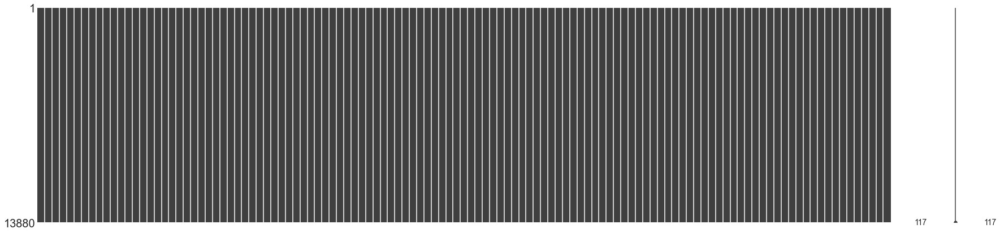

In [78]:
# Plot visualisation of the missing values for each feature of the raw DataFrame, df_fbref_outfield_raw
msno.matrix(df_fbref_outfield_raw, figsize = (30, 7))

In [79]:
# Counts of missing values
null_value_stats = df_fbref_outfield_raw.isnull().sum(axis=0)
null_value_stats[null_value_stats != 0]

Series([], dtype: int64)

No values are NULL or missing in the data set.

<a id='section4'></a>

## <a id='#section4'>4. Data Preprocessing</a>

#### Assigning Raw DataFrame to New Engineered DataFrame

In [ ]:
df_fbref_outfield = df_fbref_outfield_raw


<a id='section4.1'></a>

### <a id='#section4.1'>4.1  Creating a data frame to store names of all the teams in Top 5 European Leagues</a>

In [81]:
# Create DataFrame of Home and Away teams

## All unique Home and Away teams
lst_teams = list(df_fbref_outfield['team'].unique())


## DataFrames of Home and Away teams
df_teams = pd.DataFrame(lst_teams)


## Export DataFrame
if not os.path.exists(os.path.join(data_dir + '/fbref/reference/team/fbref_teams_big5_latest.csv')):
    
    ### Save latest version
    df_teams.to_csv(data_dir + '/fbref/reference/team/fbref_teams_big5_latest.csv', index=None, header=True)

    ### Save a copy to archive folder (dated)
    df_teams.to_csv(data_dir + f'/fbref/reference/team/archive/fbref_teams_big5_last_updated_{today}.csv', index=None, header=True)    

else:
    df_teams = pd.read_csv(data_dir + '/fbref/reference/team/fbref_teams_big5_latest.csv')
    print('Data already saved previously')

In [82]:
df_teams.head()

,0
0,Mainz 05
1,Dortmund
2,Düsseldorf
3,Nürnberg
4,Wolfsburg



<a id='section4.2'></a>

### <a id='#section4.2'>4.2  Removing Special Characters and Lower Casing Player Names</a>

In [83]:
# Remove accents and create lowercase name
df_fbref_outfield['Player Lower'] = (df_fbref_outfield['player']
                                         .str.normalize('NFKD')
                                         .str.encode('ascii', errors='ignore')
                                         .str.decode('utf-8')
                                         .str.lower()
                                    )

In [84]:
# First Name Lower
df_fbref_outfield['First Name Lower'] = df_fbref_outfield['Player Lower'].str.rsplit(' ', 0).str[0]

# Last Name Lower
df_fbref_outfield['Last Name Lower'] = df_fbref_outfield['Player Lower'].str.rsplit(' ', 1).str[-1]

# First Initial Lower
df_fbref_outfield['First Initial Lower'] = df_fbref_outfield['Player Lower'].astype(str).str[0]

In [85]:
df_fbref_outfield.head()

,player,nationality,position,team,comp_level,age,birth_year,games,games_starts,minutes,...,pens_conceded,own_goals,ball_recoveries,aerials_won,aerials_lost,aerials_won_pct,Player Lower,First Name Lower,Last Name Lower,First Initial Lower
1533,Aarón Martín,es ESP,DF,Mainz 05,de Bundesliga,21,1997,33.0,32.0,2878.0,...,0.0,0.0,166.0,23.0,36.0,39.0,aaron martin,aaron,martin,a
639,Abdou Diallo,sn SEN,DF,Dortmund,de Bundesliga,22,1996,28.0,27.0,2379.0,...,0.0,0.0,153.0,49.0,40.0,55.1,abdou diallo,abdou,diallo,a
1013,Achraf Hakimi,ma MAR,DF,Dortmund,de Bundesliga,19,1998,21.0,19.0,1740.0,...,0.0,0.0,137.0,15.0,18.0,45.5,achraf hakimi,achraf,hakimi,a
305,Adam Bodzek,de GER,"MF,DF",Düsseldorf,de Bundesliga,32,1985,21.0,20.0,1596.0,...,2.0,0.0,63.0,34.0,21.0,61.8,adam bodzek,adam,bodzek,a
2646,Adam Zreľák,sk SVK,FW,Nürnberg,de Bundesliga,24,1994,14.0,10.0,941.0,...,0.0,0.0,15.0,53.0,88.0,37.6,adam zrelak,adam,zrelak,a



<a id='section4.3'></a>

### <a id='#section4.3'>4.3  String Cleaning: Mapping Countries obtained from CSV to Player Nationality in the dataset</a>

In [87]:
# Import reference CSV of country names and codes used to map to countries as part of the string cleaning
df_countries = pd.read_csv(data_dir + '/fbref/reference/countries/countries_all.csv')

df_countries 

,ID,Full Country Name,FIFA Code,IOC Code,ISO Code
0,1,Afghanistan,AFG,AFG,AFG
1,2,Åland Islands,ALA,NaN,ALA
2,3,Albania,ALB,ALB,ALB
3,4,Algeria,ALG,ALG,DZA
4,5,American Samoa,ASA,ASA,ASM
...,...,...,...,...,...
249,250,Wallis and Futuna,WLF,NaN,WLF
250,251,Western Sahara,ESH,NaN,ESH
251,252,Yemen,YEM,YEM,YEM
252,253,Zambia,ZAM,ZAM,ZMB


In [90]:
df_fbref_outfield['Nationality Code'] = df_fbref_outfield['nationality'].str.strip().str[-3:]
df_fbref_outfield.head()

,player,nationality,position,team,comp_level,age,birth_year,games,games_starts,minutes,...,own_goals,ball_recoveries,aerials_won,aerials_lost,aerials_won_pct,Player Lower,First Name Lower,Last Name Lower,First Initial Lower,Nationality Code
1533,Aarón Martín,es ESP,DF,Mainz 05,de Bundesliga,21,1997,33.0,32.0,2878.0,...,0.0,166.0,23.0,36.0,39.0,aaron martin,aaron,martin,a,ESP
639,Abdou Diallo,sn SEN,DF,Dortmund,de Bundesliga,22,1996,28.0,27.0,2379.0,...,0.0,153.0,49.0,40.0,55.1,abdou diallo,abdou,diallo,a,SEN
1013,Achraf Hakimi,ma MAR,DF,Dortmund,de Bundesliga,19,1998,21.0,19.0,1740.0,...,0.0,137.0,15.0,18.0,45.5,achraf hakimi,achraf,hakimi,a,MAR
305,Adam Bodzek,de GER,"MF,DF",Düsseldorf,de Bundesliga,32,1985,21.0,20.0,1596.0,...,0.0,63.0,34.0,21.0,61.8,adam bodzek,adam,bodzek,a,GER
2646,Adam Zreľák,sk SVK,FW,Nürnberg,de Bundesliga,24,1994,14.0,10.0,941.0,...,0.0,15.0,53.0,88.0,37.6,adam zrelak,adam,zrelak,a,SVK


In [91]:
dict(zip(df_countries['FIFA Code'], df_countries['Full Country Name']))
pd.Series(df_countries['FIFA Code'].values,index=df_countries['Full Country Name']).to_dict()
dict_countries = df_countries.set_index('FIFA Code').to_dict()['Full Country Name']
dict_countries 

{'AFG': 'Afghanistan',
 'ALA': 'Åland Islands',
 'ALB': 'Albania',
 'ALG': 'Algeria',
 'ASA': 'American Samoa',
 'AND': 'Andorra',
 'ANG': 'Angola',
 'AIA': 'Anguilla',
 'ATA': 'Antarctica',
 'ATG': 'Antigua and Barbuda',
 'ARG': 'Argentina',
 'ARM': 'Armenia',
 'ARU': 'Aruba',
 'AUS': 'Australia',
 'AUT': 'Austria',
 'AZE': 'Azerbaijan',
 'BAH': 'The Bahamas',
 'BHR': 'Bahrain',
 'BAN': 'Bangladesh',
 'BRB': 'Barbados',
 'BLR': 'Belarus',
 'BEL': 'Belgium',
 'BLZ': 'Belize',
 'BEN': 'Benin',
 'BER': 'Bermuda',
 'BHU': 'Bhutan',
 'BOL': 'Bolivia',
 'BES': 'Caribbean Netherlands: Bonaire, Sint Eustatius and Saba',
 'BIH': 'Bosnia and Herzegovina',
 'BOT': 'Botswana',
 'BVT': 'Bouvet Island',
 'BRA': 'Brazil',
 'IOT': 'British Indian Ocean Territory',
 'VGB': 'British Virgin Islands',
 'BRU': 'Brunei',
 'BUL': 'Bulgaria',
 'BFA': 'Burkina Faso',
 'BDI': 'Burundi',
 'CAM': 'Cambodia',
 'CMR': 'Cameroon',
 'CAN': 'Canada',
 'CPV': 'Cape Verde',
 'CAY': 'Cayman Islands',
 'CTA': 'Central Af

In [92]:
df_fbref_outfield['Nationality Cleaned'] = df_fbref_outfield['Nationality Code'].map(dict_countries)
df_fbref_outfield.head()

,player,nationality,position,team,comp_level,age,birth_year,games,games_starts,minutes,...,ball_recoveries,aerials_won,aerials_lost,aerials_won_pct,Player Lower,First Name Lower,Last Name Lower,First Initial Lower,Nationality Code,Nationality Cleaned
1533,Aarón Martín,es ESP,DF,Mainz 05,de Bundesliga,21,1997,33.0,32.0,2878.0,...,166.0,23.0,36.0,39.0,aaron martin,aaron,martin,a,ESP,Spain
639,Abdou Diallo,sn SEN,DF,Dortmund,de Bundesliga,22,1996,28.0,27.0,2379.0,...,153.0,49.0,40.0,55.1,abdou diallo,abdou,diallo,a,SEN,Senegal
1013,Achraf Hakimi,ma MAR,DF,Dortmund,de Bundesliga,19,1998,21.0,19.0,1740.0,...,137.0,15.0,18.0,45.5,achraf hakimi,achraf,hakimi,a,MAR,Morocco
305,Adam Bodzek,de GER,"MF,DF",Düsseldorf,de Bundesliga,32,1985,21.0,20.0,1596.0,...,63.0,34.0,21.0,61.8,adam bodzek,adam,bodzek,a,GER,Germany
2646,Adam Zreľák,sk SVK,FW,Nürnberg,de Bundesliga,24,1994,14.0,10.0,941.0,...,15.0,53.0,88.0,37.6,adam zrelak,adam,zrelak,a,SVK,Slovakia


<a id='section4.4'></a>

### <a id='#section4.4'>4.4  String Cleaning: Cleaning League names in the dataset</a>

In [97]:
## Define league names and cleaned league names
dict_league_names = {'eng Premier League': 'Premier League',
                     'fr Ligue 1': 'Ligue 1',
                     'de Bundesliga': 'Bundeliga',
                     'it Serie A': 'Serie A',
                     'es La Liga': 'La Liga'
                    }
df_fbref_outfield['Comp'] = df_fbref_outfield['comp_level'].map(dict_league_names)


In [98]:
df_fbref_outfield.tail()

,player,nationality,position,team,comp_level,age,birth_year,games,games_starts,minutes,...,aerials_won,aerials_lost,aerials_won_pct,Player Lower,First Name Lower,Last Name Lower,First Initial Lower,Nationality Code,Nationality Cleaned,Comp
12310,Zlatan Ibrahimović,se SWE,FW,Milan,it Serie A,41-158,1981,2.0,0.0,42.0,...,3.0,2.0,60.0,zlatan ibrahimovic,zlatan,ibrahimovic,z,SWE,Sweden,Serie A
11811,Ángel Di María,ar ARG,"FW,MF",Juventus,it Serie A,35-024,1988,16.0,11.0,876.0,...,1.0,1.0,50.0,angel di maria,angel,maria,a,ARG,Argentina,Serie A
11917,Éderson,br BRA,MF,Atalanta,it Serie A,23-246,1999,22.0,14.0,1266.0,...,10.0,15.0,40.0,ederson,ederson,ederson,e,BRA,Brazil,Serie A
12371,Þórir Jóhann Helgason,is ISL,MF,Lecce,it Serie A,22-163,2000,8.0,2.0,162.0,...,1.0,4.0,20.0,orir johann helgason,orir,helgason,o,ISL,Iceland,Serie A
13477,Łukasz Skorupski,pl POL,GK,Bologna,it Serie A,31-309,1991,25.0,25.0,2250.0,...,4.0,0.0,100.0,ukasz skorupski,ukasz,skorupski,u,POL,Poland,Serie A


<a id='section4.5'></a>

### <a id='#section4.5'>4.5  Grouping Player Positions and Defining a grouped position</a>

In [100]:
## Define positions and their grouped position names
dict_positions_grouped = {'DF': 'Defender',
                          'DF,FW': 'Defender',
                          'DF,GK': 'Defender',
                          'DF,MF': 'Defender',
                          'FW': 'Forward',
                          'FW,DF': 'Forward',
                          'FW,MF': 'Forward',
                          'GK': 'Goalkeeper',
                          'GK,FW': 'Goalkeeper',
                          'MF': 'Midfielder',
                          'MF,DF': 'Midfielder',
                          'MF,FW': 'Midfielder',
                          'MF,GK': 'Midfielder',
                         }
df_fbref_outfield['Primary Pos'] = df_fbref_outfield['position'].str[:2]
# Map grouped positions to DataFrame
df_fbref_outfield['Position Grouped'] = df_fbref_outfield['position'].map(dict_positions_grouped)
df_fbref_outfield.head()

,player,nationality,position,team,comp_level,age,birth_year,games,games_starts,minutes,...,aerials_won_pct,Player Lower,First Name Lower,Last Name Lower,First Initial Lower,Nationality Code,Nationality Cleaned,Comp,Primary Pos,Position Grouped
1533,Aarón Martín,es ESP,DF,Mainz 05,de Bundesliga,21,1997,33.0,32.0,2878.0,...,39.0,aaron martin,aaron,martin,a,ESP,Spain,Bundeliga,DF,Defender
639,Abdou Diallo,sn SEN,DF,Dortmund,de Bundesliga,22,1996,28.0,27.0,2379.0,...,55.1,abdou diallo,abdou,diallo,a,SEN,Senegal,Bundeliga,DF,Defender
1013,Achraf Hakimi,ma MAR,DF,Dortmund,de Bundesliga,19,1998,21.0,19.0,1740.0,...,45.5,achraf hakimi,achraf,hakimi,a,MAR,Morocco,Bundeliga,DF,Defender
305,Adam Bodzek,de GER,"MF,DF",Düsseldorf,de Bundesliga,32,1985,21.0,20.0,1596.0,...,61.8,adam bodzek,adam,bodzek,a,GER,Germany,Bundeliga,MF,Midfielder
2646,Adam Zreľák,sk SVK,FW,Nürnberg,de Bundesliga,24,1994,14.0,10.0,941.0,...,37.6,adam zrelak,adam,zrelak,a,SVK,Slovakia,Bundeliga,FW,Forward



<a id='section4.6'></a>

### <a id='#section4.6'>4.6 Converting Data Types</a>

Age column converted from string to integer

In [105]:
## Converting Data Types
## Convert age to string and then to int64
df_fbref_outfield['age'] = df_fbref_outfield['age'].astype(str)
df_fbref_outfield['age'] = df_fbref_outfield['age'].str[:2]
df_fbref_outfield['age'] = pd.to_numeric(df_fbref_outfield['age'], errors='coerce')
df_fbref_outfield['age'] = np.nan_to_num(df_fbref_outfield['age']).astype(int)

Converting Birth year from String to integer

In [107]:
df_fbref_outfield['birth_year'] = pd.to_numeric(df_fbref_outfield['birth_year'])

In [109]:
df_fbref_outfield.head()

,player,nationality,position,team,comp_level,age,birth_year,games,games_starts,minutes,...,aerials_won_pct,Player Lower,First Name Lower,Last Name Lower,First Initial Lower,Nationality Code,Nationality Cleaned,Comp,Primary Pos,Position Grouped
1533,Aarón Martín,es ESP,DF,Mainz 05,de Bundesliga,21,1997,33.0,32.0,2878.0,...,39.0,aaron martin,aaron,martin,a,ESP,Spain,Bundeliga,DF,Defender
639,Abdou Diallo,sn SEN,DF,Dortmund,de Bundesliga,22,1996,28.0,27.0,2379.0,...,55.1,abdou diallo,abdou,diallo,a,SEN,Senegal,Bundeliga,DF,Defender
1013,Achraf Hakimi,ma MAR,DF,Dortmund,de Bundesliga,19,1998,21.0,19.0,1740.0,...,45.5,achraf hakimi,achraf,hakimi,a,MAR,Morocco,Bundeliga,DF,Defender
305,Adam Bodzek,de GER,"MF,DF",Düsseldorf,de Bundesliga,32,1985,21.0,20.0,1596.0,...,61.8,adam bodzek,adam,bodzek,a,GER,Germany,Bundeliga,MF,Midfielder
2646,Adam Zreľák,sk SVK,FW,Nürnberg,de Bundesliga,24,1994,14.0,10.0,941.0,...,37.6,adam zrelak,adam,zrelak,a,SVK,Slovakia,Bundeliga,FW,Forward


### Export DataFrame

In [113]:
# Export DataFrame as a CSV file

## Export a copy to the FBref Engineered Outfield folder called 'latest' (can be overwritten)
df_fbref_outfield.to_csv(data_dir_fbref + '/engineered/outfield/fbref_outfield_player_stats_combined_latest.csv', index=None, header=True)

## Export a copy to the 'archive' subfolder, including the date
df_fbref_outfield.to_csv(data_dir_fbref + f'/engineered/outfield/archive/fbref_outfield_player_stats_combined_last_updated_{today}.csv', index=None, header=True)

Number of Unique Players

In [122]:
#Number of unique players
len(df_fbref_outfield['Player Lower'].unique().tolist())

5264

The Number of Forwards

In [124]:
#Number of players with primary position FW
df_players_raw_fw = df_fbref_outfield[df_fbref_outfield['Primary Pos'] == 'FW']

len(df_players_raw_fw['Player Lower'].unique().tolist())

1590

In [125]:
# Print the shape of the raw DataFrame, df_fbref_outfield
print(df_fbref_outfield.shape)

(13880, 126)


In [128]:
# Description of the raw DataFrame, df_fbref_outfield, showing some summary statistics for each numberical column in the DataFrame
df_fbref_outfield.describe()

,age,birth_year,games,games_starts,minutes,goals,assists,pens_made,pens_att,cards_yellow,...,fouls,fouled,offsides,pens_won,pens_conceded,own_goals,ball_recoveries,aerials_won,aerials_lost,aerials_won_pct
count,13880.000000,13880.000000,13880.000000,13880.000000,13880.000000,13880.000000,13880.000000,13880.000000,13880.000000,13880.000000,...,13880.000000,13880.000000,13880.000000,13880.000000,13880.000000,13880.000000,13880.000000,13880.000000,13880.000000,13880.000000
mean,25.414193,1994.386671,17.731772,13.331556,1196.824784,1.632637,1.134942,0.161167,0.203098,2.495605,...,15.053098,14.243588,2.219308,0.149135,0.203098,0.050648,64.446686,19.284222,19.282925,44.478148
std,4.551281,4.742461,11.099607,10.933905,944.788889,3.140143,1.913247,0.739042,0.866409,2.648048,...,14.352358,15.698808,4.475618,0.471944,0.500340,0.230187,59.582861,25.557728,22.788290,25.055209
min,14.000000,1977.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,22.000000,1991.000000,7.000000,3.000000,318.750000,0.000000,0.000000,0.000000,0.000000,0.000000,...,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,14.000000,3.000000,3.000000,30.775000
50%,25.000000,1995.000000,18.000000,12.000000,1064.000000,0.000000,0.000000,0.000000,0.000000,2.000000,...,12.000000,9.000000,0.000000,0.000000,0.000000,0.000000,48.000000,10.000000,13.000000,46.300000
75%,29.000000,1998.000000,27.000000,22.000000,1919.000000,2.000000,2.000000,0.000000,0.000000,4.000000,...,23.000000,21.000000,2.000000,0.000000,0.000000,0.000000,101.000000,26.000000,28.000000,58.925000
max,42.000000,2007.000000,38.000000,38.000000,3420.000000,41.000000,21.000000,14.000000,15.000000,17.000000,...,98.000000,167.000000,53.000000,6.000000,5.000000,3.000000,326.000000,307.000000,275.000000,100.000000


In [131]:
print(len(df_fbref_outfield.columns))
for col in df_fbref_outfield.columns:
    print(col)

126
player
nationality
position
team
comp_level
age
birth_year
games
games_starts
minutes
goals
assists
pens_made
pens_att
cards_yellow
cards_red
goals_per90
assists_per90
goals_assists_per90
goals_pens_per90
goals_assists_pens_per90
xg
npxg
xg_per90
npxg_per90
Season
minutes_90s
shots_on_target
shots_free_kicks
shots_on_target_pct
shots_on_target_per90
goals_per_shot
goals_per_shot_on_target
npxg_per_shot
xg_net
npxg_net
passes_completed
passes
passes_pct
passes_total_distance
passes_progressive_distance
passes_completed_short
passes_short
passes_pct_short
passes_completed_medium
passes_medium
passes_pct_medium
passes_completed_long
passes_long
passes_pct_long
assisted_shots
passes_into_final_third
passes_into_penalty_area
crosses_into_penalty_area
progressive_passes
passes_live
passes_dead
passes_free_kicks
through_balls
passes_switches
crosses
corner_kicks
corner_kicks_in
corner_kicks_out
corner_kicks_straight
throw_ins
passes_offsides
passes_blocked
sca
sca_per90
sca_passes_live
sc


<a id='section4.7'></a>

### <a id='#section4.7'>4.7 Creating Per 90 Stats</a>

Standardising stats to per 90 to allow players that have had less minutes on the field or had less time on the ball to be compared to firt team regular players.

The following Stats from the original Dataset have been converted to per 90 stats:
- **Goals Per Shot**
- **Goals Per Shot on Target**
- **Non Goals XG per Shot**
- **XG NET**
- **Passes Into Final Third**
- **Passes Into Penalty Area**
- **Crosses Into Penalty Area**
- **Progressive Passes**
- **Through Balls**
- **Carries Into Penalty Area**




In [132]:
## Creating per 90 stats for later use
df_players = df_fbref_outfield
df_players['goals_per_shot_per90'] = (df_players['goals_per_shot'] / df_players['minutes']) * 90
df_players['goals_per_shot_on_target_per90'] = (df_players['goals_per_shot_on_target'] / df_players['minutes']) * 90
df_players['npxg_per_shot_per90'] = (df_players['npxg_per_shot'] / df_players['minutes']) * 90
df_players['xg_net_per90'] = (df_players['xg_net'] / df_players['minutes']) * 90
df_players['passes_into_final_third_per90'] = (df_players['passes_into_final_third'] / df_players['minutes']) * 90
df_players['passes_into_penalty_area_per90'] = (df_players['passes_into_penalty_area'] / df_players['minutes']) * 90
df_players['crosses_into_penalty_area_per90'] = (df_players['crosses_into_penalty_area'] / df_players['minutes']) * 90
df_players['progressive_passes_per90'] = (df_players['progressive_passes'] / df_players['minutes']) * 90
df_players['through_balls_per90'] = (df_players['through_balls'] / df_players['minutes']) * 90
df_players['carries_into_penalty_area_per90'] = (df_players['carries_into_penalty_area'] / df_players['minutes']) * 90
df_players.head()

,player,nationality,position,team,comp_level,age,birth_year,games,games_starts,minutes,...,goals_per_shot_per90,goals_per_shot_on_target_per90,npxg_per_shot_per90,xg_net_per90,passes_into_final_third_per90,passes_into_penalty_area_per90,crosses_into_penalty_area_per90,progressive_passes_per90,through_balls_per90,carries_into_penalty_area_per90
1533,Aarón Martín,es ESP,DF,Mainz 05,de Bundesliga,21,1997,33.0,32.0,2878.0,...,0.000000,0.000000,0.001251,-0.025017,2.314107,1.188325,0.719249,3.314802,0.062543,0.343989
639,Abdou Diallo,sn SEN,DF,Dortmund,de Bundesliga,22,1996,28.0,27.0,2379.0,...,0.003783,0.009458,0.009836,-0.022699,4.653216,0.416141,0.302648,4.728878,0.037831,0.075662
1013,Achraf Hakimi,ma MAR,DF,Dortmund,de Bundesliga,19,1998,21.0,19.0,1740.0,...,0.005172,0.020690,0.004138,0.015517,4.913793,1.396552,0.362069,5.534483,0.258621,0.879310
305,Adam Bodzek,de GER,"MF,DF",Düsseldorf,de Bundesliga,32,1985,21.0,20.0,1596.0,...,0.000000,0.000000,0.002256,-0.005639,2.424812,0.225564,0.000000,3.214286,0.000000,0.112782
2646,Adam Zreľák,sk SVK,FW,Nürnberg,de Bundesliga,24,1994,14.0,10.0,941.0,...,0.011477,0.031562,0.021041,-0.162593,0.669501,0.095643,0.000000,0.860786,0.000000,0.000000


<a id='section4.8'></a>

### <a id='#section4.8'>4.8 Subset Data of only Forwards with at least 10 Matches
</a>

Filter for Forwards that have played at least 10 Matches or 900 minutes during a season

In [134]:
## Subset Data
# Filter for Forwards that have played at least 10 matches (900 minutes)
df_players_fw = df_players[
                            (df_players['Primary Pos'] ==  'FW') &
                            (df_players['Season'].isin(['2018-2019', '2019-2020', '2020-2021', '2021-2022', '2022-2023'])) &
                            (df_players['minutes'] >= 90 * 10)
                           ]

In [136]:
# Check the variance in the dataset before and after filtration
print('No. rows in Players DataFrame BEFORE filtration: {}'.format(len(df_players)))
print('No. rows AFTER filtration: {}'.format(len(df_players_fw)))
print('-'*10+'\n')


No. rows in Players DataFrame BEFORE filtration: 13880
No. rows AFTER filtration: 1606
----------





<a id='section4.9'></a>

### <a id='#section4.9'>4.9 Selecting Numerical and String Columns of Interest
</a>

As part of the analysis, we require a mix of player performance stats and player bio

The player performance metrics that are to go into the clustering are metrics for a forward. Irrelevant metrics for defending and goalkeeping are not included as this will distrort the player profiles to be identified in the clustering.
The columns of interest from the dataset are the following...

In [516]:
## Selecting colums of interest
## String Columns:
cols_str = ['Player Lower',
            'Season',
            'Comp',
            'Primary Pos',
            'position',
            'age',
            'birth_year',
            'Nationality Cleaned',
            'team'
]
cols_stats = ['games',
              'games_starts',
              'minutes',
              'goals',
              'assists',
              'goals_per90',
              'assists_per90',
              'goals_assists_per90',
              'goals_pens_per90',
              'goals_assists_pens_per90',
              'xg_per90',
              'npxg_per90',
              'minutes_90s',
              'shots_on_target_pct',
              'shots_on_target_per90',
              'goals_per_shot_per90',
              'goals_per_shot_on_target_per90',
              'npxg_per_shot_per90',
              'xg_net_per90',
              'passes_into_final_third_per90',
              'passes_into_penalty_area_per90',
              'crosses_into_penalty_area_per90',
              'progressive_passes_per90',
              'through_balls_per90',
              'carries_into_penalty_area_per90',
              'progressive_carries'            
]

#### Create a DataFrame of just Numerical values

In [472]:
# Create DataFrame of numerical values

## Select columns of interest
df_players_fw_stats = df_players_fw[cols_stats]

## Display DataFrame
df_players_fw_stats.head()

,goals,assists,goals_per90,assists_per90,goals_assists_per90,goals_pens_per90,goals_assists_pens_per90,xg_per90,npxg_per90,minutes_90s,...,goals_per_shot_on_target_per90,npxg_per_shot_per90,xg_net_per90,passes_into_final_third_per90,passes_into_penalty_area_per90,crosses_into_penalty_area_per90,progressive_passes_per90,through_balls_per90,carries_into_penalty_area_per90,progressive_carries
2646,2.0,1.0,0.19,0.10,0.29,0.19,0.29,0.36,0.36,10.5,...,0.031562,0.021041,-0.162593,0.669501,0.095643,0.000000,0.860786,0.000000,0.000000,0.0
1592,6.0,5.0,0.32,0.27,0.59,0.32,0.59,0.21,0.21,18.8,...,0.024468,0.005851,0.106383,1.489362,1.436170,0.372340,3.936170,0.212766,0.904255,36.0
1962,12.0,4.0,0.43,0.14,0.58,0.43,0.58,0.38,0.37,27.8,...,0.010427,0.004315,0.057531,1.474231,0.683180,0.071914,2.265282,0.035957,1.042749,65.0
803,10.0,1.0,0.67,0.07,0.74,0.40,0.47,0.71,0.50,14.8,...,0.028989,0.014157,-0.040449,1.280899,0.606742,0.067416,1.820225,0.134831,0.808989,21.0
683,5.0,2.0,0.47,0.19,0.65,0.47,0.65,0.27,0.27,10.7,...,0.046778,0.009356,0.196466,0.280665,0.467775,0.187110,0.748441,0.000000,0.748441,33.0


In [473]:
df_players_fw_stats.shape

(1606, 23)

#### Replacing all Null Values if any.

In [474]:
# Replace all the NULL values with zero.
df_players_fw_stats.fillna(0, inplace=True)

/var/folders/nv/yhx12vpj1vz672s8q9xw9ylw0000gn/T/ipykernel_73741/3759243583.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_players_fw_stats.fillna(0, inplace=True)





<a id='section4.10'></a>

### <a id='#section4.10'>4.10 Data Normalisation
</a>

Normalising the data to scale the values of the features into a similar range.

The MinMaxScaler is used to standardise all the numerical values in the data to have a mean of approx 0 and variance of 1.

In [584]:
## Standardise Data
x = df_players_fw_stats.values    # NumPy array
scaler = preprocessing.MinMaxScaler()
x_scaled = scaler.fit_transform(x)
X_norm = pd.DataFrame(x_scaled)


<a id='section4.11'></a>

### <a id='#section4.11'>4.11 Dimentionality Reduction using PCA
</a>

PCA is used to reduce the dimensionality of a dataset while retaining most of its important information, by tranforming large set of variables into a smaller one that still contains most of the information.

Here PCA is used to reduce the dimentionality for only Visualisations, For traing the clustering algorithms all the features are being used.

In [585]:
# Create a PCA Instance
pca = PCA()
pca.fit(X_norm)

PCA()

Determine the optimal number of components which capture the greatest amount of variance in the data.

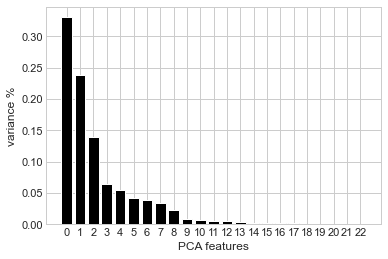

In [586]:
# Plot the explained variances
features = range(pca.n_components_)
plt.bar(features, pca.explained_variance_ratio_, color='black')
plt.xlabel('PCA features')
plt.ylabel('variance %')
plt.xticks(features)
plt.show()

<a id='section5'></a>

## <a id='#section5'>5. Learning Methods
</a>

<a id='section5.1'></a>

### <a id='#section5.1'>5.1  K-Means
</a>

K-Means clustering is a clustering algorithm that involves the following steps: 
-     First, a user specifies the number of clusters (K) and randomly selects initial centroids. 
-     Then, the algorithm iteratively assigns each observation to one of the K clusters until the assignments stop changing. 
-     Next, the mean is calculated for each of the K clusters. Finally, each observation is assigned to the cluster whose mean is closest to it. 
-     The objective is to form clusters in a way that maximizes the similarity of observations within the same cluster. 
   
K-Means clustering measures similarity using the Squared Euclidean distance.

In [ ]:
kmeans_pca_2d = PCA(n_components=2)

# Save components to a DataFrame
df_reduced = pd.DataFrame(kmeans_pca_2d.fit_transform(X_norm))

In [588]:
df_reduced.head(10)

,0,1
0,-0.364910,0.603039
1,-0.005329,-0.079077
2,0.320816,-0.164016
3,0.246158,0.477178
4,0.028878,0.517735
5,-0.295003,-0.262616
6,0.265565,-0.095312
7,-0.311442,0.317614
8,-0.083366,0.335727
9,0.234359,0.404751


<a id='section5.1.1'></a>

#### <a id='#section5.1.1'>5.1.1  Determining Elbow
</a>

To find the appropriate number of clusters, one can calculate the Within Cluster Sum of Squares (WCSS) for various cluster solutions. The WCSS values can be plotted in an Elbow plot, and the number of clusters can be determined by selecting the elbow point on the curve. The elbow point is the number of clusters where the rate of WCSS reduction begins to level off, indicating that additional clusters do not significantly improve the clustering performance.

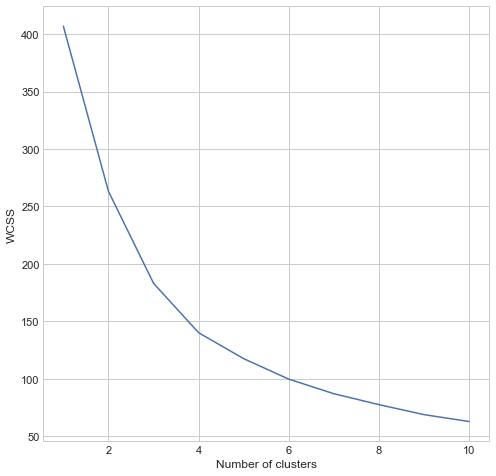

In [589]:
## Determining elbow
wcss = []

for i in range(1,11):
    model = KMeans(n_clusters = i, init = "k-means++", max_iter = 600, random_state=42)
    model.fit(df_reduced)
    wcss.append(model.inertia_)

plt.figure(figsize=(8, 8))
plt.plot(range(1,11), wcss)
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

The plot shows that there is an elbow near 4, hence we will be considering 4 clusters.

<a id='section5.1.2'></a>

#### <a id='#section5.1.2'>5.1.2  Silhouette Score to determine optimal number of clusters
</a>

For n_clusters = 2 The average silhouette_score is : 0.3517643638160773
For n_clusters = 3 The average silhouette_score is : 0.3579423672179299
For n_clusters = 4 The average silhouette_score is : 0.3465608526411299
For n_clusters = 5 The average silhouette_score is : 0.3210605029601038
For n_clusters = 6 The average silhouette_score is : 0.32695659588683545
For n_clusters = 7 The average silhouette_score is : 0.32950588845850814
For n_clusters = 8 The average silhouette_score is : 0.3206865282670317
For n_clusters = 9 The average silhouette_score is : 0.3282346817062359
For n_clusters = 10 The average silhouette_score is : 0.32452984247592154


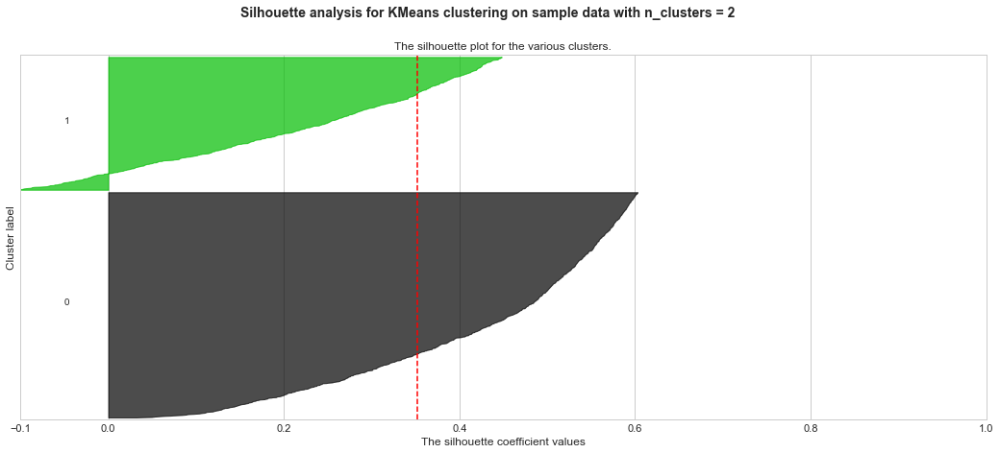

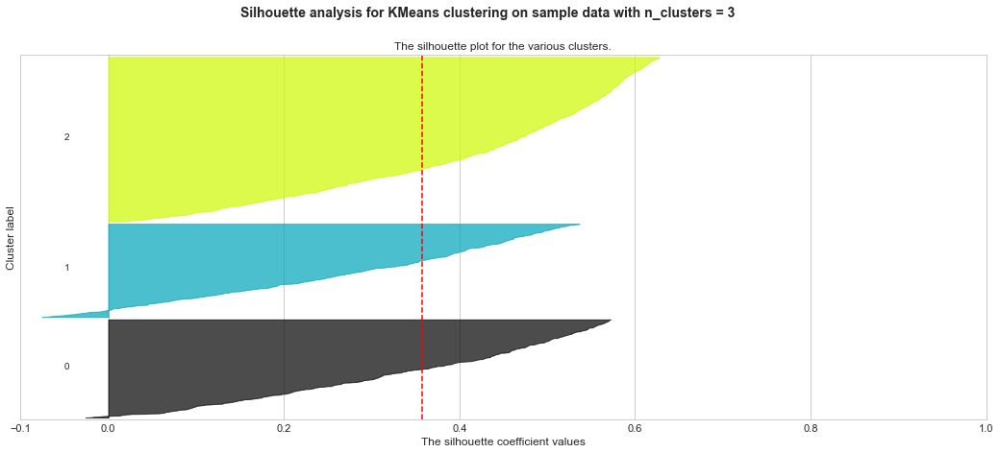

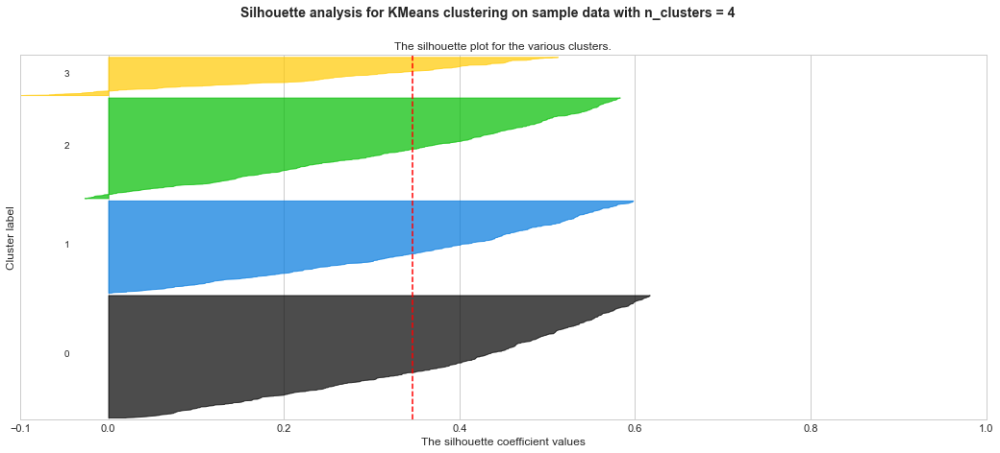

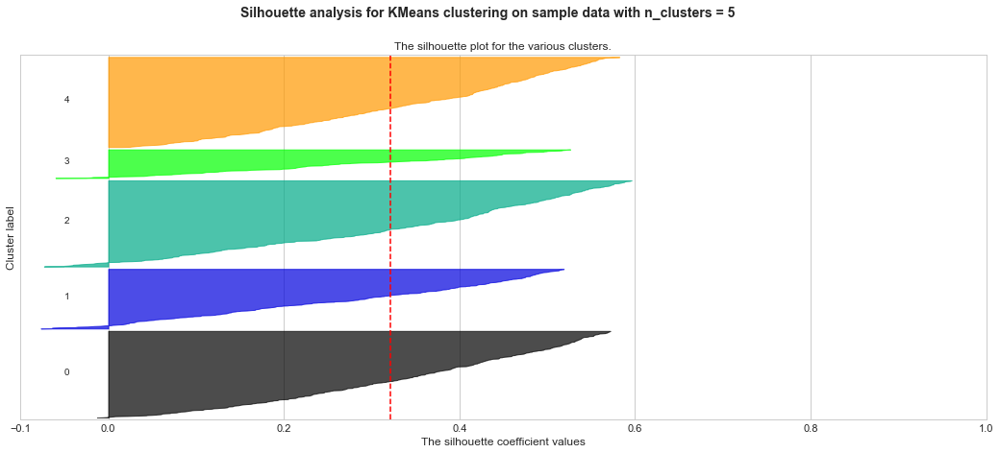

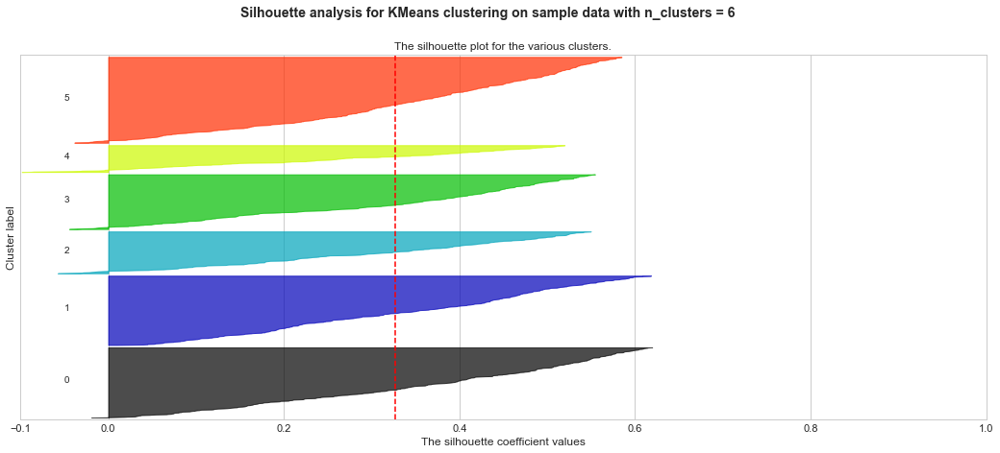

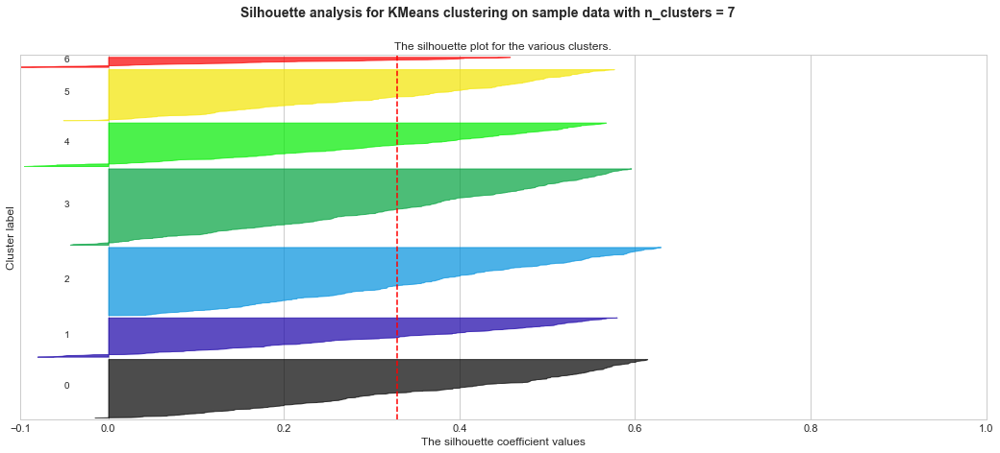

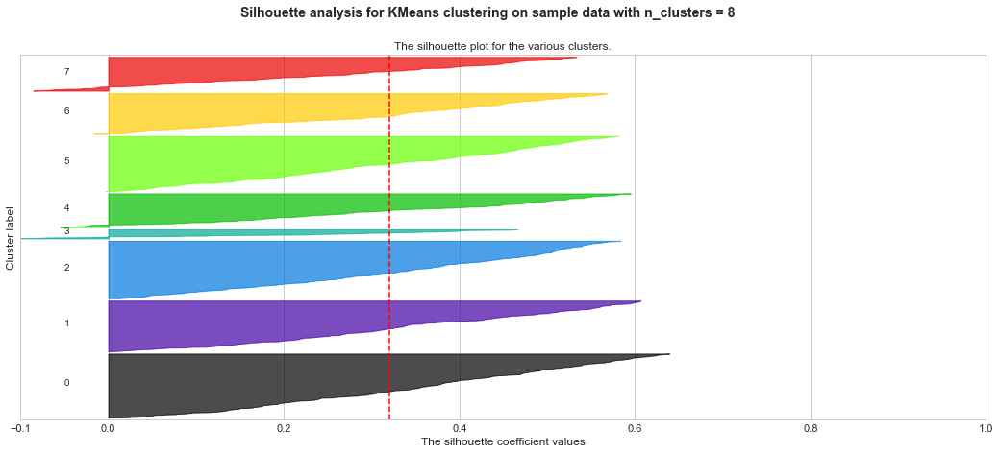

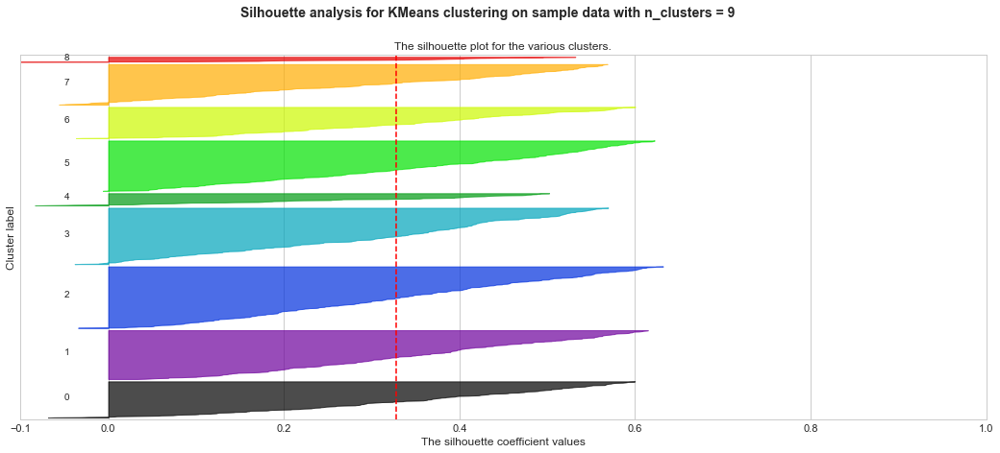

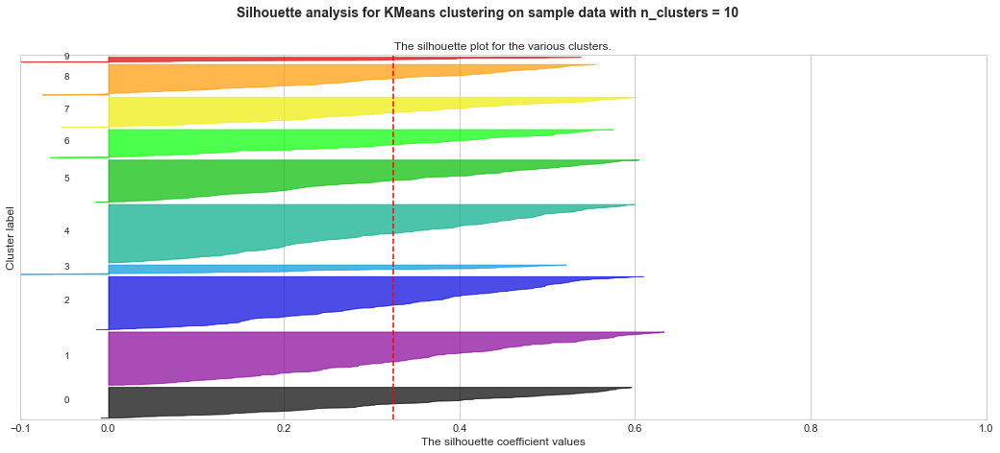

In [591]:
range_n_clusters = [2,3,4,5,6,7,8,9,10]
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1) = plt.subplots(1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(df_reduced) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters,init='k-means++', max_iter=600, random_state=42)
    cluster_labels = clusterer.fit_predict(df_reduced)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(df_reduced, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_reduced, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1]

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

The average Silhouette score is being drastically decreased when number of clusters is 4. Hence we will be considering 4 clusters.

<a id='section5.1.3'></a>

#### <a id='#section5.1.3'>5.1.3  Clustering the Data using K-Means
</a>

In [592]:
# K-Means Clustering

## Specify the number of clusters
kmeans = KMeans(n_clusters=4, init='k-means++', max_iter=600, random_state=42)

## Fit the input data
kmeans = kmeans.fit(df_reduced)

## Get the cluster labels
labels = kmeans.predict(df_reduced)

## Centroid values
centroid = kmeans.cluster_centers_

## Cluster values
clusters = kmeans.labels_.tolist()

In [593]:
## Silhouette score of Kmeans
km_score = silhouette_score(df_reduced, clusters)
print('Silhouetter Score: %.3f' % km_score)

Silhouetter Score: 0.347


In [594]:
## Davies Bouldin Score of Kmeans
km_davies_bouldin_score = davies_bouldin_score(df_reduced,clusters)
km_davies_bouldin_score

0.8777551503192457

In [595]:
## Calinski Score for Kmeans
km_calinski_score = calinski_harabasz_score(df_reduced, clusters)
km_calinski_score

1016.7282138852587

In [596]:
# Convert string attributes to lists to be joined back onto the resulting DataFrame
names = df_players_fw['Player Lower'].tolist()
season = df_players_fw['Season'].tolist()
minutes = df_players_fw['minutes'].tolist()
matches_played = df_players_fw['games'].tolist()
matches_started = df_players_fw['games_starts'].tolist()
team = df_players_fw['team'].tolist()
comp = df_players_fw['Comp'].tolist()
primary_pos = df_players_fw['Primary Pos'].tolist()
pos = df_players_fw['position'].tolist()
age = df_players_fw['age'].tolist()
birth_year = df_players_fw['birth_year'].tolist()
nationality = df_players_fw['Nationality Cleaned'].tolist()






In [597]:
df_reduced['cluster'] = clusters
df_reduced['name'] = names
df_reduced['season'] = season
df_reduced['minutes'] = minutes
df_reduced['matches_played'] = matches_played
df_reduced['matches_started'] = matches_started
df_reduced['comp'] = comp
df_reduced['team'] = team
df_reduced['primary_pos'] = primary_pos
df_reduced['pos'] = pos
df_reduced['age'] = age
df_reduced['birth_year'] = birth_year
df_reduced['nationality'] = nationality


In [598]:
df_reduced.columns = ['x',
                      'y',
                      'cluster',
                      'name',
                      'season',
                      'minutes',
                      'matches_played',
                      'matches_started',
                      'comp',
                      'team',
                      'primary_pos',
                      'pos',
                      'age',
                      'birth_year',
                      'nationality'
]

In [599]:
df_reduced.shape

(1606, 15)

In [600]:
df_reduced.head()

,x,y,cluster,name,season,minutes,matches_played,matches_started,comp,team,primary_pos,pos,age,birth_year,nationality
0,-0.364910,0.603039,2,adam zrelak,2018-2019,941.0,14.0,10.0,Bundeliga,Nürnberg,FW,FW,24,1994,Slovakia
1,-0.005329,-0.079077,1,admir mehmedi,2018-2019,1692.0,26.0,20.0,Bundeliga,Wolfsburg,FW,"FW,MF",27,1991,Switzerland
2,0.320816,-0.164016,1,alassane plea,2018-2019,2503.0,34.0,28.0,Bundeliga,M'Gladbach,FW,FW,25,1993,France
3,0.246158,0.477178,2,alfre finnbogason,2018-2019,1335.0,18.0,17.0,Bundeliga,Augsburg,FW,FW,29,1989,Iceland
4,0.028878,0.517735,2,anastasios donis,2018-2019,962.0,24.0,11.0,Bundeliga,Stuttgart,FW,"FW,MF",21,1996,Greece


<a id='section5.1.4'></a>

#### <a id='#section5.1.4'>5.1.4  Data Visualisation
</a>

/Users/sayedsohail/opt/anaconda3/lib/python3.9/site-packages/seaborn/regression.py:581: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


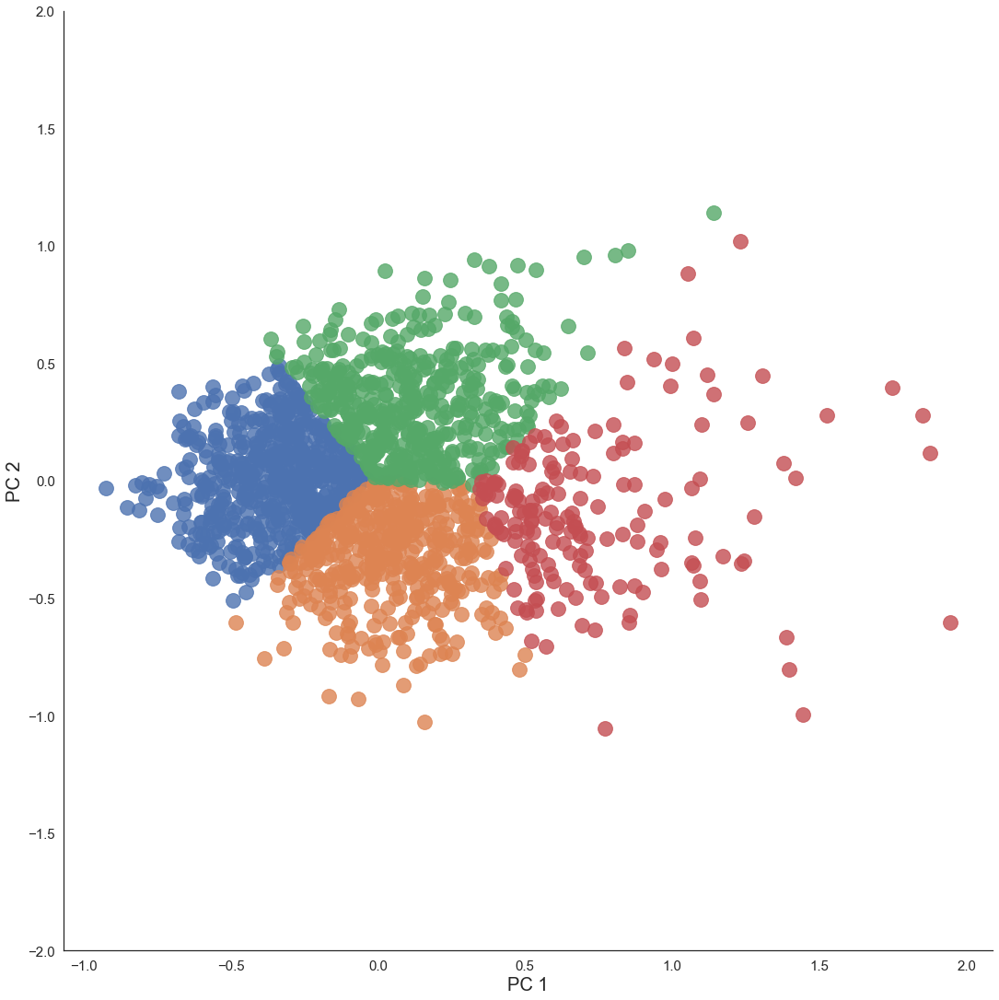

In [601]:
#Data Visualisation
# Visualise the clustering
sns.set(style='white')
ax = sns.lmplot(x='x', y='y', hue='cluster', data=df_reduced, legend=False,
fit_reg=False, size = 15, scatter_kws={"s": 250})
texts = []
#for x, y, s in zip(df_reduced.x, df_reduced.y, df_reduced.name):
    #texts.append(plt.text(x, y, s))
ax.set(ylim=(-2, 2))
plt.tick_params(labelsize=15)
plt.xlabel('PC 1', fontsize = 20)
plt.ylabel('PC 2', fontsize = 20)
plt.show()

<a id='section5.2'></a>

### <a id='#section5.2'>5.2  GMM
</a>

The Gaussian Mixture Model (GMM) algorithm is a statistical technique used for clustering and density estimation. It assumes that the data is generated by a mixture of several Gaussian distributions, each with its own mean and variance. The GMM algorithm attempts to estimate the parameters of these Gaussians and use them to assign each data point to a particular cluster.

The basic idea of the GMM algorithm is as follows:

- Initialization: Choose the number of clusters (k) and randomly initialize the mean and covariance of each Gaussian.

- Expectation step: Assign each data point to a cluster by calculating the probability that it belongs to each Gaussian distribution. This is done using Bayes' theorem and the estimated mean and covariance of each Gaussian.

- Maximization step: Update the parameters of each Gaussian based on the assigned data points. This is done by maximizing the likelihood function using the Expectation-Maximization (EM) algorithm.

- Repeat steps 2 and 3 until convergence.

The GMM algorithm can be used for both clustering and density estimation. In clustering, the algorithm assigns each data point to a particular cluster based on the highest probability of belonging to that cluster.

In [602]:
## GMM
## Standardise Data
gmm_data = df_players_fw_stats.values   # NumPy array
gmm_scaler = preprocessing.MinMaxScaler()
gmm_scaled = gmm_scaler.fit_transform(gmm_data)
gmm_norm = pd.DataFrame(gmm_scaled)
gmm_norm.describe()

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
count,1606.000000,1606.000000,1606.000000,1606.000000,1606.000000,1606.000000,1606.000000,1606.000000,1606.000000,1606.000000,...,1606.000000,1606.000000,1606.000000,1606.000000,1606.000000,1606.000000,1606.000000,1606.000000,1606.000000,1606.000000
mean,0.174361,0.143005,0.230801,0.177730,0.271256,0.245745,0.270483,0.278208,0.277855,0.349811,...,0.234960,0.205140,0.417759,0.152258,0.197792,0.134135,0.186310,0.063123,0.215436,0.176532
std,0.132613,0.126268,0.136848,0.138094,0.135400,0.145231,0.133811,0.146694,0.142554,0.245665,...,0.138648,0.121411,0.110924,0.098018,0.132967,0.154157,0.120120,0.073405,0.147234,0.134056
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.073171,0.047619,0.133333,0.084337,0.175824,0.142857,0.177515,0.171171,0.173469,0.146429,...,0.141788,0.120231,0.343896,0.087576,0.101594,0.028244,0.100719,0.018379,0.107911,0.076087
50%,0.146341,0.095238,0.206667,0.156627,0.252747,0.222222,0.254438,0.261261,0.255102,0.303571,...,0.203718,0.177072,0.410898,0.127829,0.167448,0.083245,0.156133,0.041474,0.181672,0.137681
75%,0.243902,0.190476,0.306667,0.253012,0.340659,0.325397,0.343195,0.360360,0.357143,0.516964,...,0.298418,0.262083,0.484642,0.194767,0.266288,0.187612,0.249843,0.085216,0.287722,0.239130
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [603]:
pca_2 = PCA()
pca_2.fit(gmm_norm)

PCA()

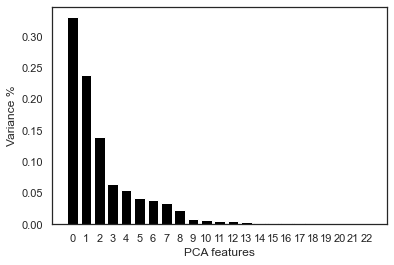

In [604]:
features = range(pca_2.n_components_)
plt.bar(features, pca_2.explained_variance_ratio_, color='black')
plt.xlabel('PCA features')
plt.ylabel('Variance %')
plt.xticks(features)
plt.show()

In [605]:
# Create a 2D PCA Instance
pca_2d = PCA(n_components=2)

# Save components to a DataFrame
gmm_df_reduced = pd.DataFrame(pca_2d.fit_transform(gmm_norm))

<a id='section5.2.1'></a>

### <a id='#section5.2.1'>5.2.1  Determining Optimal Number of Clusters using BIC and AIC
</a>

The Bayesian Information Criterion (BIC) and Akaike Information Criterion (AIC) are two statistical metrics used in Gaussian Mixture Model (GMM) clustering to determine the optimal number of clusters.

BIC and AIC are both measures of the quality of the model fit and take into account the number of parameters in the model. They penalize models with a large number of parameters, thus avoiding overfitting.

The AIC is defined as AIC = 2k - 2ln(L), where k is the number of parameters in the model and L is the likelihood function of the data. The BIC is defined as BIC = kln(n) - 2ln(L), where n is the number of data points.

In both cases, the lower the value of the metric, the better the model fit. When comparing GMM models with different numbers of clusters, the model with the lowest AIC or BIC value is typically selected as the optimal model

In [606]:
n_components = np.arange(1, 21)
models = [GMM(n,covariance_type='full', random_state=0).fit(gmm_df_reduced) for n in n_components]
gmm_model_comparisons=pd.DataFrame({"n_components" : n_components,
                                  "BIC" : [m.bic(gmm_df_reduced) for m in models],
                                   "AIC" : [m.aic(gmm_df_reduced) for m in models]})
gmm_model_comparisons.head()

,n_components,BIC,AIC
0,1,2473.474276,2446.566767
1,2,2320.961238,2261.764717
2,3,2321.916713,2230.431181
3,4,2308.612846,2184.838302
4,5,2338.261262,2182.197707


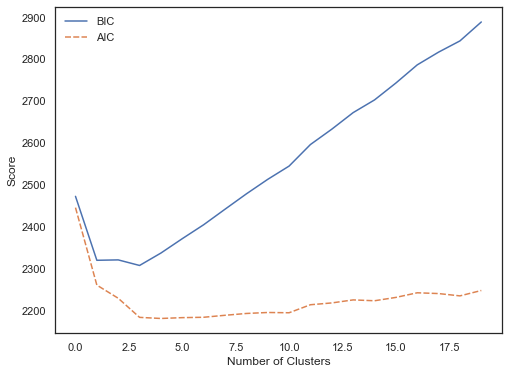

In [607]:
plt.figure(figsize=(8,6))
sns.lineplot(data=gmm_model_comparisons[["BIC","AIC"]])
plt.xlabel("Number of Clusters")
plt.ylabel("Score")
plt.savefig("GMM_model_comparison_with_AIC_BIC_Scores_Python.png",
                    format='png',dpi=150)

As we can see from the above table and graph the BIC and AIC values are lower when Number of Clusters is 4. Hence Selecting 4 Clusters for GMM Clustering

<a id='section5.2.2'></a>

### <a id='#section5.2.2'>5.2.2  Clustering Data using GMM
</a>

In [608]:
gmm = GMM(n_components=4)
gmm = gmm.fit(gmm_df_reduced)
gmm_labels = gmm.predict(gmm_df_reduced)
gmm_labels_list = gmm_labels.tolist()

In [616]:
## Silhouette Score for GMM
gmm_score = silhouette_score(gmm_norm, gmm_labels)
print('Silhouette Score: %.3f' % gmm_score)

Silhouette Score: 0.160


In [610]:
## Davies Bouldin Socre for GMM
gmm_davies_bouldin_score = davies_bouldin_score(gmm_norm,gmm_labels)
gmm_davies_bouldin_score

1.6807706185997255

In [611]:
## Calinski Score for GMM
gmm_calinski_score = calinski_harabasz_score(gmm_norm, gmm_labels)
gmm_calinski_score

314.36191877045707

In [612]:
gmm_df_reduced['cluster'] = gmm_labels_list
gmm_df_reduced['name'] = names
gmm_df_reduced['season'] = season
gmm_df_reduced['minutes'] = minutes
gmm_df_reduced['matches_played'] = matches_played
gmm_df_reduced['matches_started'] = matches_started
gmm_df_reduced['comp'] = comp
gmm_df_reduced['team'] = team
gmm_df_reduced['primary_pos'] = primary_pos
gmm_df_reduced['pos'] = pos
gmm_df_reduced['age'] = age
gmm_df_reduced['birth_year'] = birth_year
gmm_df_reduced['nationality'] = nationality

In [613]:
gmm_df_reduced.columns = ['x',
                      'y',
                      'cluster',
                      'name',
                      'season',
                      'minutes',
                      'matches_played',
                      'matches_started',
                      'comp',
                      'team',
                      'primary_pos',
                      'pos',
                      'age',
                      'birth_year',
                      'nationality'
]

<a id='section5.2.3'></a>

### <a id='#section5.2.3'>5.2.3  Data Visualisation
</a>

/Users/sayedsohail/opt/anaconda3/lib/python3.9/site-packages/seaborn/regression.py:581: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


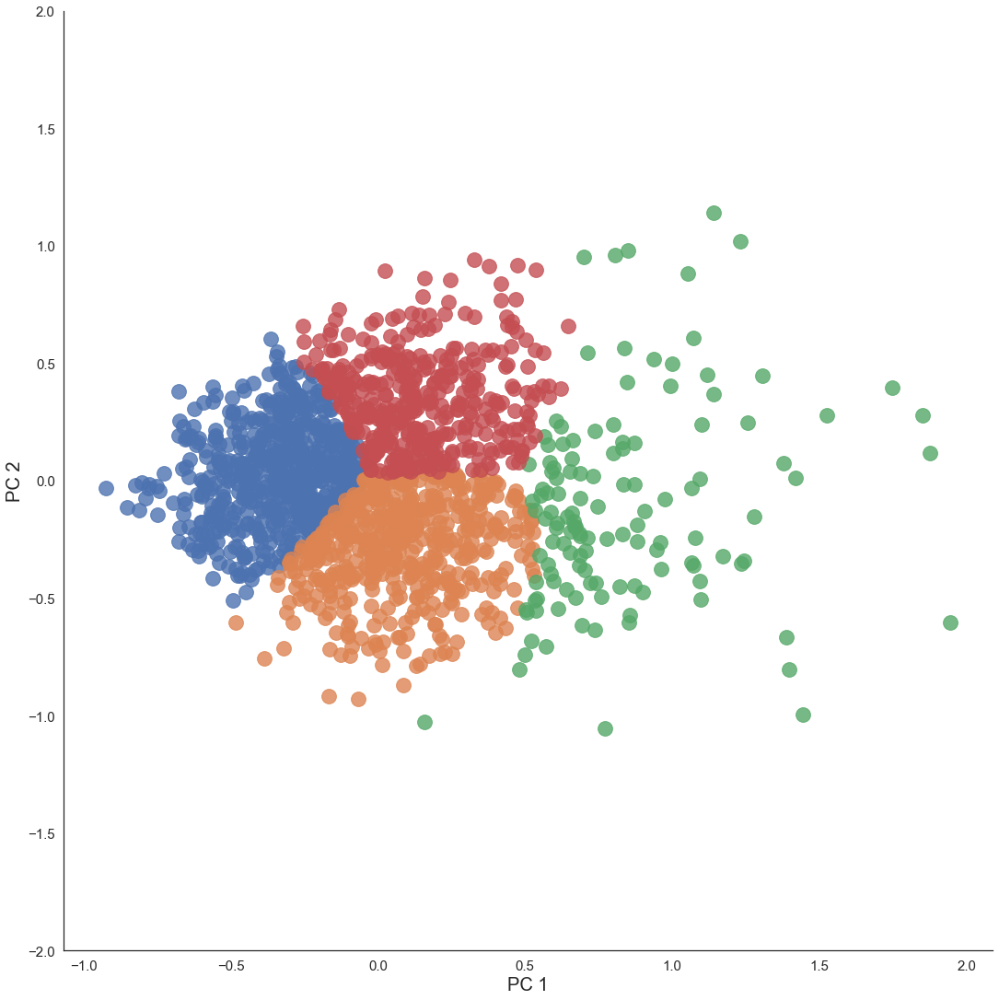

In [614]:
sns.set(style='white')
ax = sns.lmplot(x='x', y='y', hue='cluster', data=gmm_df_reduced, legend=False,
fit_reg=False, size = 15, scatter_kws={"s": 250})
texts = []
# for x, y, s in zip(df_reduced.x, df_reduced.y, df_reduced.name):
#     texts.append(plt.text(x, y, s))
ax.set(ylim=(-2, 2))
plt.tick_params(labelsize=15)
plt.xlabel('PC 1', fontsize = 20)
plt.ylabel('PC 2', fontsize = 20)
plt.show()

<a id='section6'></a>

### <a id='#section6'>6. Comparing K-means and GMM
</a>

Silhouette Score, Davies Bouldin Score, and Calinski Harabasz Score are all metrics used to evaluate the quality of clustering results.

- Silhouette Score: measures how well each data point fits into its assigned cluster, and how far it is from the neighbouring clusters. The score ranges from -1 to 1, where a score closer to 1 indicates a better clustering result. Higher scores indicate that the data points are well-clustered and separated from each other.

- Davies Bouldin Score: measures the average similarity between each cluster and its most similar cluster, and compares this to the average distance between each cluster and its most dissimilar cluster. Lower scores indicate better clustering results, with values closer to 0 indicating better separation between the clusters.

- Calinski Harabasz Score: measures the ratio of the between-cluster dispersion to the within-cluster dispersion. Higher scores indicate better clustering results, with larger differences in dispersion between the clusters and smaller dispersion within each cluster.


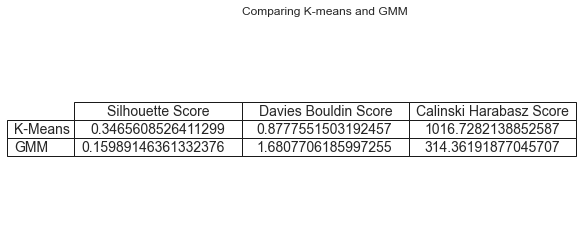

In [628]:
# Import matplotlib
import matplotlib.pyplot as plt

# Define the data for the table as a list of lists
cmp_data = [[km_score, km_davies_bouldin_score, km_calinski_score],
        [gmm_score, gmm_davies_bouldin_score, gmm_calinski_score]]

# Define the column labels and row labels for the table
cmp_columns = ["Silhouette Score", "Davies Bouldin Score", "Calinski Harabasz Score"]
cmp_rows = ["K-Means", "GMM"]

# Create a figure and axes for the table
fig, ax = plt.subplots(figsize=(6, 4))

# Draw the table using matplotlib table function
table = ax.table(cellText=cmp_data,
                 colLabels=cmp_columns,
                 rowLabels=cmp_rows,
                 loc="center")

# Adjust the margins and labels of the table
ax.set_title("Comparing K-means and GMM")
ax.axis("off")
table.auto_set_font_size(False)
table.set_fontsize(14)
table.scale(1.5, 1.5)

# Show the table
plt.show()

From the above Table we can interpret that, K-Means algorithm has better Silhouette Score, Davies Bouldin Score and Calinski Harabasz Score when compared with GMM for the given Data Set. This could be because the data points are well separated and belong to distinct clusters: K-means works well when the clusters are well-separated and have a spherical shape. If the data points belong to distinct clusters with little overlap, K-means can quickly and accurately group them together. Also, K-means works well with uniformly distributed data, where the cluster centers are equidistant from each other. If the data is uniformly distributed, the K-means algorithm can quickly converge to an optimal solution.

<a id='section7'></a>

## <a id='#section7'>7. Analysis
</a>

<a id='section7.1'></a>

### <a id='#section7.1'>7.1 Analysing Kylian Mbappe's performance over past 5 seasons
</a>

In [629]:
df_reduced['cluster'].value_counts()

0    556
2    457
1    419
3    174
Name: cluster, dtype: int64

The results from K-means produces 4 distinct clusters, the most populus being cluster 0 with 556 players, followed by cluster 2 (457), 1 (419) and 3 (174) 

In [633]:
gmm_df_reduced['cluster'].value_counts()

0    585
1    500
3    393
2    128
Name: cluster, dtype: int64

The results from GMM produces 4 distinct clusters, the most populus being cluster 0 with 585 players, followed by cluster 1 (500), 3 (393) and 2 (128) 

The next step is to identify the cluster(s) that Kylian Mbappe is located for the five seasons of data 2018-2019 to 2022-2023

In [568]:
# Subset the reduced DataFrame for kylian mbappe data points using K-means
df_reduced_mbappe = df_reduced[df_reduced['name'].str.contains('kylian mbappe')]

## Select columns of interest
df_reduced_mbappe = df_reduced_mbappe[['x', 'y', 'cluster', 'season']]

# Display the DataFrame
df_reduced_mbappe

,x,y,cluster,season
992,1.874440,0.119329,3,2018-2019
1067,1.526649,0.276810,3,2019-2020
1131,1.277519,-0.151959,3,2020-2021
1202,1.387960,-0.666055,3,2021-2022
1261,1.093180,0.008615,3,2022-2023


K-means: From the results we can see that Mbappe is found in the cluster 3 for the past 5 seasons.

Visualising to see where the points for Mbappe lie.

In [634]:
# Subset the reduced DataFrame for kylian mbappe data points
gmm_df_reduced_mbappe = gmm_df_reduced[gmm_df_reduced['name'].str.contains('kylian mbappe')]

## Select columns of interest
gmm_df_reduced_mbappe = gmm_df_reduced_mbappe[['x', 'y', 'cluster', 'season']]

# Display the DataFrame
gmm_df_reduced_mbappe

,x,y,cluster,season
992,1.874440,0.119329,2,2018-2019
1067,1.526649,0.276810,2,2019-2020
1131,1.277519,-0.151959,2,2020-2021
1202,1.387960,-0.666055,2,2021-2022
1261,1.093180,0.008615,2,2022-2023


GMM: From the results we can see that Mbappe is found in the cluster 2 for the past 5 seasons.

Visualising to see where the points for Mbappe lie.

#### Create variables for each of the x, y coordinates of the kylian mbappe data points, to be plotted on the visualisation

In [569]:
# Create variables for each of the x, y coordinates of the kylian mbappe data points, to be plotted on the visualisation
mbappe_x_1819 = float(df_reduced['x'][(df_reduced['season'] == '2018-2019') & (df_reduced['name'].str.contains('kylian mbappe'))])
mbappe_y_1819 = float(df_reduced['y'][(df_reduced['season'] == '2018-2019') & (df_reduced['name'].str.contains('kylian mbappe'))])

mbappe_x_1920 = float(df_reduced['x'][(df_reduced['season'] == '2019-2020') & (df_reduced['name'].str.contains('kylian mbappe'))])
mbappe_y_1920 = float(df_reduced['y'][(df_reduced['season'] == '2019-2020') & (df_reduced['name'].str.contains('kylian mbappe'))])

mbappe_x_2021 = float(df_reduced['x'][(df_reduced['season'] == '2020-2021') & (df_reduced['name'].str.contains('kylian mbappe'))])
mbappe_y_2021 = float(df_reduced['y'][(df_reduced['season'] == '2020-2021') & (df_reduced['name'].str.contains('kylian mbappe'))])

mbappe_x_2122 = float(df_reduced['x'][(df_reduced['season'] == '2021-2022') & (df_reduced['name'].str.contains('kylian mbappe'))])
mbappe_y_2122 = float(df_reduced['y'][(df_reduced['season'] == '2021-2022') & (df_reduced['name'].str.contains('kylian mbappe'))])

mbappe_x_2223 = float(df_reduced['x'][(df_reduced['season'] == '2022-2023') & (df_reduced['name'].str.contains('kylian mbappe'))])
mbappe_y_2223 = float(df_reduced['y'][(df_reduced['season'] == '2022-2023') & (df_reduced['name'].str.contains('kylian mbappe'))])

# Find the centroid (midpoint) of the 18/19-22/23 mbappe data points triangle
mbappe_x_centroid = (mbappe_x_1819 + mbappe_x_1920 + mbappe_x_2021 + mbappe_x_2122 + mbappe_x_2223 ) / 5
mbhttp://localhost:8888/notebooks/QMUL/SEM-B/Data%20Analytics/Project/Coursework1/Coursework1-Copy1.ipynb#appe_y_centroid = (mbappe_y_1819 + mbappe_y_1920 + mbappe_y_2021 + mbappe_y_2122 + mbappe_y_2223 ) / 5

In [636]:
# Create variables for each of the x, y coordinates of the kylian mbappe data points, to be plotted on the visualisation
gmm_mbappe_x_1819 = float(gmm_df_reduced['x'][(gmm_df_reduced['season'] == '2018-2019') & (gmm_df_reduced['name'].str.contains('kylian mbappe'))])
gmm_mbappe_y_1819 = float(gmm_df_reduced['y'][(gmm_df_reduced['season'] == '2018-2019') & (gmm_df_reduced['name'].str.contains('kylian mbappe'))])

gmm_mbappe_x_1920 = float(gmm_df_reduced['x'][(gmm_df_reduced['season'] == '2019-2020') & (gmm_df_reduced['name'].str.contains('kylian mbappe'))])
gmm_mbappe_y_1920 = float(gmm_df_reduced['y'][(gmm_df_reduced['season'] == '2019-2020') & (gmm_df_reduced['name'].str.contains('kylian mbappe'))])

gmm_mbappe_x_2021 = float(gmm_df_reduced['x'][(gmm_df_reduced['season'] == '2020-2021') & (gmm_df_reduced['name'].str.contains('kylian mbappe'))])
gmm_mbappe_y_2021 = float(gmm_df_reduced['y'][(gmm_df_reduced['season'] == '2020-2021') & (gmm_df_reduced['name'].str.contains('kylian mbappe'))])

gmm_mbappe_x_2122 = float(gmm_df_reduced['x'][(gmm_df_reduced['season'] == '2021-2022') & (gmm_df_reduced['name'].str.contains('kylian mbappe'))])
gmm_mbappe_y_2122 = float(gmm_df_reduced['y'][(gmm_df_reduced['season'] == '2021-2022') & (gmm_df_reduced['name'].str.contains('kylian mbappe'))])

gmm_mbappe_x_2223 = float(gmm_df_reduced['x'][(gmm_df_reduced['season'] == '2022-2023') & (gmm_df_reduced['name'].str.contains('kylian mbappe'))])
gmm_mbappe_y_2223 = float(gmm_df_reduced['y'][(gmm_df_reduced['season'] == '2022-2023') & (gmm_df_reduced['name'].str.contains('kylian mbappe'))])

# Find the centroid (midpoint) of the 18/19-22/23 mbappe data points triangle
gmm_mbappe_x_centroid = (gmm_mbappe_x_1819 + gmm_mbappe_x_1920 + gmm_mbappe_x_2021 + gmm_mbappe_x_2122 + gmm_mbappe_x_2223 ) / 5
gmm_mbappe_y_centroid = (gmm_mbappe_y_1819 + gmm_mbappe_y_1920 + gmm_mbappe_y_2021 + gmm_mbappe_y_2122 + gmm_mbappe_y_2223 ) / 5

#### Visualising Mbappe Data Points - K-Means

/Users/sayedsohail/opt/anaconda3/lib/python3.9/site-packages/seaborn/regression.py:581: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


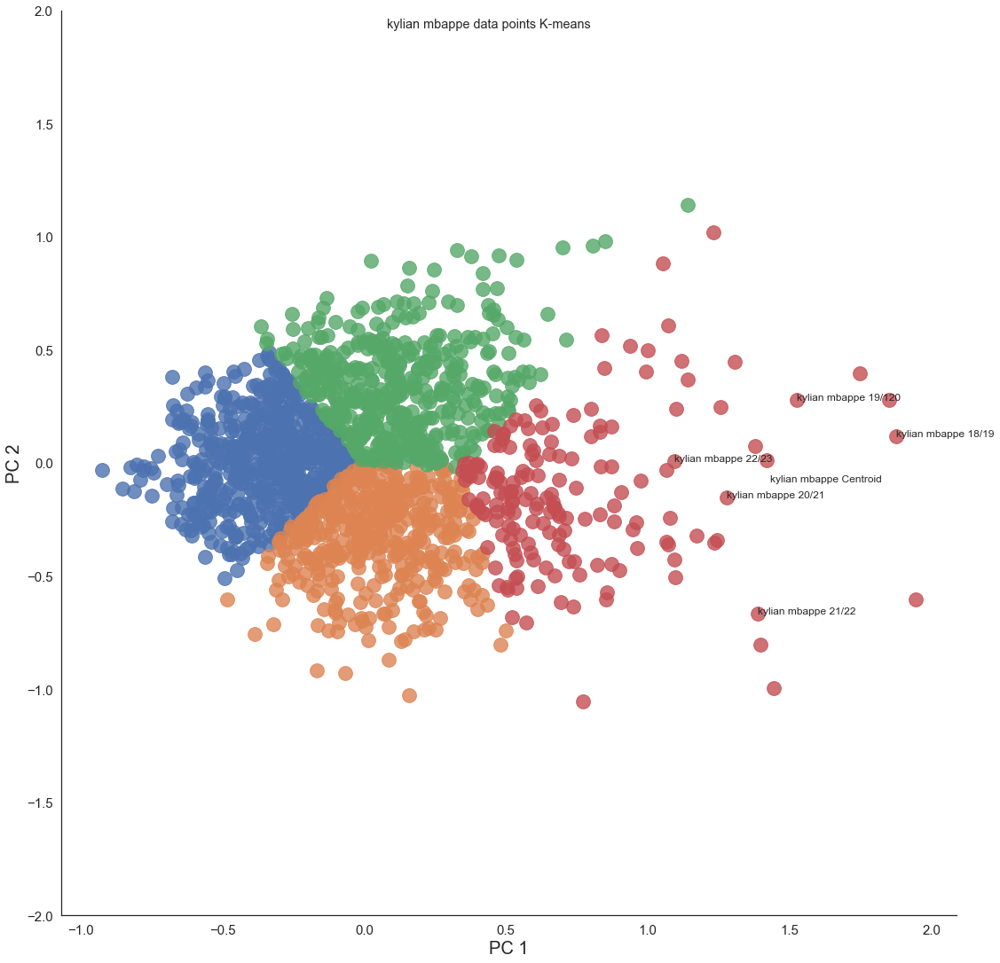

In [632]:
# Visualise the clustering, now including kylian mbappe data points
sns.set(style="white")
ax = sns.lmplot(x="x", y="y", hue='cluster', data = df_reduced, legend=False,
fit_reg=False, size = 15, scatter_kws={"s": 250})
texts = []
ax.fig.suptitle('kylian mbappe data points K-means')
plt.annotate("kylian mbappe 18/19", (mbappe_x_1819, mbappe_y_1819))
plt.annotate("kylian mbappe 19/120", (mbappe_x_1920, mbappe_y_1920))
plt.annotate("kylian mbappe 20/21", (mbappe_x_2021, mbappe_y_2021))
plt.annotate("kylian mbappe 21/22", (mbappe_x_2122, mbappe_y_2122))
plt.annotate("kylian mbappe 22/23", (mbappe_x_2223, mbappe_y_2223))
plt.annotate("kylian mbappe Centroid", (mbappe_x_centroid, mbappe_y_centroid))
ax.set(ylim=(-2, 2))
plt.tick_params(labelsize=15)
plt.xlabel("PC 1", fontsize = 20)
plt.ylabel("PC 2", fontsize = 20)
plt.show()

From the visualisation we can see that pints for Mbappe are in red cluster(3).
The visualisation also plots the centroid of the Mbappe points.

#### Visualising Mbappe Data Points - GMM

/Users/sayedsohail/opt/anaconda3/lib/python3.9/site-packages/seaborn/regression.py:581: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


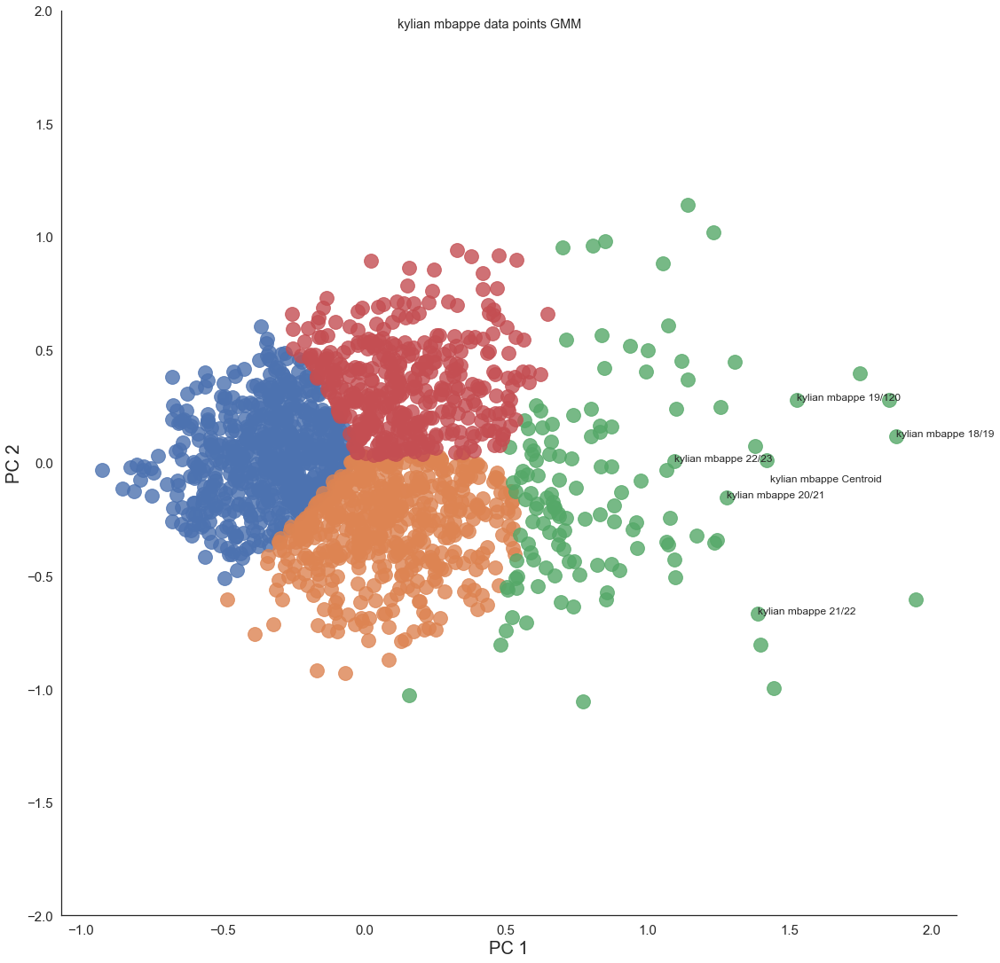

In [637]:
# Visualise the clustering, now including kylian mbappe data points
sns.set(style="white")
ax = sns.lmplot(x="x", y="y", hue='cluster', data = gmm_df_reduced, legend=False,
fit_reg=False, size = 15, scatter_kws={"s": 250})
texts = []
ax.fig.suptitle('kylian mbappe data points GMM')
plt.annotate("kylian mbappe 18/19", (gmm_mbappe_x_1819, gmm_mbappe_y_1819))
plt.annotate("kylian mbappe 19/120", (gmm_mbappe_x_1920, gmm_mbappe_y_1920))
plt.annotate("kylian mbappe 20/21", (gmm_mbappe_x_2021, gmm_mbappe_y_2021))
plt.annotate("kylian mbappe 21/22", (gmm_mbappe_x_2122, gmm_mbappe_y_2122))
plt.annotate("kylian mbappe 22/23", (gmm_mbappe_x_2223, gmm_mbappe_y_2223))
plt.annotate("kylian mbappe Centroid", (gmm_mbappe_x_centroid, gmm_mbappe_y_centroid))
ax.set(ylim=(-2, 2))
plt.tick_params(labelsize=15)
plt.xlabel("PC 1", fontsize = 20)
plt.ylabel("PC 2", fontsize = 20)
plt.show()

From the visualisation we can see that pints for Mbappe are in Green cluster(2).
The visualisation also plots the centroid of the Mbappe points.

Determining the distance of  each player  to each of the Mbappe points and from the centroid. This will help us to identify the players that are similar to mbappe

In [641]:
# Determine the distance of each data point from each of the five mbappe data points
df_reduced['dist_mbappe_1819'] = np.sqrt( (mbappe_x_1819 - df_reduced['x'])**2 + (mbappe_y_1819 - df_reduced['y'])**2)
df_reduced['dist_mbappe_1920'] = np.sqrt( (mbappe_x_1920 - df_reduced['x'])**2 + (mbappe_y_1920 - df_reduced['y'])**2)
df_reduced['dist_mbappe_2021'] = np.sqrt( (mbappe_x_2021 - df_reduced['x'])**2 + (mbappe_y_2021 - df_reduced['y'])**2)
df_reduced['dist_mbappe_2122'] = np.sqrt( (mbappe_x_2122 - df_reduced['x'])**2 + (mbappe_y_2122 - df_reduced['y'])**2)
df_reduced['dist_mbappe_2223'] = np.sqrt( (mbappe_x_2223 - df_reduced['x'])**2 + (mbappe_y_2223 - df_reduced['y'])**2)

# Determine the distance of each data point from the 17/18-19/20 mbappe data points centroid
df_reduced['dist_mbappe_centroid'] = np.sqrt( (mbappe_x_centroid - df_reduced['x'])**2 + (mbappe_y_centroid - df_reduced['y'])**2)


In [643]:
# Determine the distance of each data point from each of the five mbappe data points
gmm_df_reduced['dist_mbappe_1819'] = np.sqrt( (gmm_mbappe_x_1819 - gmm_df_reduced['x'])**2 + (gmm_mbappe_y_1819 - gmm_df_reduced['y'])**2)
gmm_df_reduced['dist_mbappe_1920'] = np.sqrt( (gmm_mbappe_x_1920 - gmm_df_reduced['x'])**2 + (gmm_mbappe_y_1920 - gmm_df_reduced['y'])**2)
gmm_df_reduced['dist_mbappe_2021'] = np.sqrt( (gmm_mbappe_x_2021 - gmm_df_reduced['x'])**2 + (gmm_mbappe_y_2021 - gmm_df_reduced['y'])**2)
gmm_df_reduced['dist_mbappe_2122'] = np.sqrt( (gmm_mbappe_x_2122 - gmm_df_reduced['x'])**2 + (gmm_mbappe_y_2122 - gmm_df_reduced['y'])**2)
gmm_df_reduced['dist_mbappe_2223'] = np.sqrt( (gmm_mbappe_x_2223 - gmm_df_reduced['x'])**2 + (gmm_mbappe_y_2223 - gmm_df_reduced['y'])**2)

# Determine the distance of each data point from the 17/18-19/20 mbappe data points centroid
gmm_df_reduced['dist_mbappe_centroid'] = np.sqrt( (gmm_mbappe_x_centroid - gmm_df_reduced['x'])**2 + (gmm_mbappe_y_centroid - gmm_df_reduced['y'])**2)


<a id='section7.2'></a>

### <a id='#section7.2'>7.2 Closest Performing players in last 5 seasons
</a>

In [572]:
# Display the DataFrame
df_reduced.head()

,x,y,cluster,name,season,minutes,matches_played,matches_started,comp,team,...,pos,age,birth_year,nationality,dist_mbappe_1819,dist_mbappe_1920,dist_mbappe_2021,dist_mbappe_2122,dist_mbappe_2223,dist_mbappe_centroid
0,-0.364910,0.603039,2,adam zrelak,2018-2019,941.0,14.0,10.0,Bundeliga,Nürnberg,...,FW,24,1994,Slovakia,2.290996,1.919485,1.807650,2.164060,1.574601,1.923247
1,-0.005329,-0.079077,1,admir mehmedi,2018-2019,1692.0,26.0,20.0,Bundeliga,Wolfsburg,...,"FW,MF",27,1991,Switzerland,1.890210,1.572772,1.284917,1.511886,1.102004,1.437283
2,0.320816,-0.164016,1,alassane plea,2018-2019,2503.0,34.0,28.0,Bundeliga,M'Gladbach,...,FW,25,1993,France,1.579250,1.283885,0.956779,1.179339,0.791421,1.114108
3,0.246158,0.477178,2,alfre finnbogason,2018-2019,1335.0,18.0,17.0,Bundeliga,Augsburg,...,FW,29,1989,Iceland,1.667140,1.296072,1.208106,1.615764,0.967987,1.311302
4,0.028878,0.517735,2,anastasios donis,2018-2019,962.0,24.0,11.0,Bundeliga,Stuttgart,...,"FW,MF",21,1996,Greece,1.888075,1.517024,1.416897,1.802350,1.179807,1.526131


### Identifying Mbappe's Cluster

Filtering the data for players in the same cluster as Mbappe.

In [639]:
# Define Mbappe cluster number - K-Means
mbappe_cluster = int(df_reduced['cluster'][(df_reduced.season == '2018-2019') & (df_reduced['name'].str.contains('kylian mbappe'))])
mbappe_cluster

3

In [644]:
# Define Mbappe cluster number  - GMM
gmm_mbappe_cluster = int(gmm_df_reduced['cluster'][(gmm_df_reduced.season == '2021-2022') & (gmm_df_reduced['name'].str.contains('kylian mbappe'))])
gmm_mbappe_cluster

2

In [647]:
# Filter the DataFrame by players in the same cluster as Mbappe - K-means
df_mbappe_cluster = df_reduced[(df_reduced['cluster'] == mbappe_cluster)]

# Display the DataFrame
# df_mbappe_cluster.sort_values(by=['dist_mbappe_centroid'], ascending=True).head(10)
df_mbappe_cluster[~df_mbappe_cluster['name'].str.contains('kylian mbappe', case=False)].sort_values(by=['dist_mbappe_centroid'], ascending=True).head(10)
## Closest performing players in all seasons


,x,y,cluster,name,season,minutes,matches_played,matches_started,comp,team,...,pos,age,birth_year,nationality,dist_mbappe_1819,dist_mbappe_1920,dist_mbappe_2021,dist_mbappe_2122,dist_mbappe_2223,dist_mbappe_centroid
108,1.419252,0.012619,3,robert lewandowski,2019-2020,2759.0,31.0,31.0,Bundeliga,Bayern Munich,...,FW,30,1988,Poland,0.467529,0.285186,0.217196,0.679395,0.326096,0.096113
225,1.377175,0.073961,3,robert lewandowski,2021-2022,2946.0,34.0,34.0,Bundeliga,Bayern Munich,...,FW,32,1988,Poland,0.499330,0.251973,0.246923,0.740094,0.291416,0.165915
117,1.244581,-0.342463,3,timo werner,2019-2020,2795.0,34.0,33.0,Bundeliga,RB Leipzig,...,FW,23,1996,Germany,0.781008,0.680486,0.193331,0.353934,0.382333,0.320326
865,1.234378,-0.351267,3,karim benzema,2021-2022,2593.0,32.0,31.0,La Liga,Real Madrid,...,FW,33,1987,France,0.794443,0.692751,0.203924,0.350255,0.386590,0.333450
1365,1.171932,-0.322932,3,ciro immobile,2019-2020,3170.0,37.0,36.0,Serie A,Lazio,...,FW,29,1990,Italy,0.830127,0.696789,0.200949,0.405465,0.340771,0.354039
129,1.066438,-0.031891,3,andre silva,2020-2021,2760.0,32.0,32.0,Bundeliga,Eint Frankfurt,...,FW,24,1995,Portugal,0.822031,0.554157,0.242841,0.711014,0.048538,0.369020
135,1.257159,0.247114,3,erling haaland,2020-2021,2407.0,28.0,27.0,Bundeliga,Dortmund,...,FW,20,2000,Norway,0.630368,0.271121,0.399592,0.922489,0.289432,0.373225
1431,1.076399,-0.241458,3,cristiano ronaldo,2020-2021,2802.0,33.0,31.0,Serie A,Juventus,...,FW,35,1985,Portugal,0.875805,0.686532,0.220135,0.526643,0.250635,0.389404
85,1.066465,-0.347191,3,jadon sancho,2019-2020,2287.0,32.0,25.0,Bundeliga,Dortmund,...,"FW,MF",19,2000,England,0.932986,0.775336,0.287505,0.452806,0.356807,0.451175
1366,1.071850,-0.360946,3,cristiano ronaldo,2019-2020,2917.0,33.0,33.0,Serie A,Juventus,...,FW,34,1985,Portugal,0.935315,0.783310,0.293216,0.439337,0.370176,0.455104


### Players in Similar Cluster to Mbappe over past 5 seasons using K-means

In [649]:

df_mbappe_cluster.shape

(174, 21)

In [705]:
# Filter the DataFrame by players in the same cluster as Mbappe - GMM
gmm_df_mbappe_cluster = gmm_df_reduced[(gmm_df_reduced['cluster'] == gmm_mbappe_cluster)]

# Display the DataFrame
# df_mbappe_cluster.sort_values(by=['dist_mbappe_centroid'], ascending=True).head(10)
gmm_df_mbappe_cluster[~gmm_df_mbappe_cluster['name'].str.contains('kylian mbappe', case=False)].sort_values(by=['dist_mbappe_centroid'], ascending=True).head(10)
## Closest performing players in all seasons


,x,y,cluster,name,season,minutes,matches_played,matches_started,comp,team,...,pos,age,birth_year,nationality,dist_mbappe_1819,dist_mbappe_1920,dist_mbappe_2021,dist_mbappe_2122,dist_mbappe_2223,dist_mbappe_centroid
108,1.419252,0.012619,2,robert lewandowski,2019-2020,2759.0,31.0,31.0,Bundeliga,Bayern Munich,...,FW,30,1988,Poland,0.467529,0.285186,0.217196,0.679395,0.326096,0.096113
225,1.377175,0.073961,2,robert lewandowski,2021-2022,2946.0,34.0,34.0,Bundeliga,Bayern Munich,...,FW,32,1988,Poland,0.499330,0.251973,0.246923,0.740094,0.291416,0.165915
117,1.244581,-0.342463,2,timo werner,2019-2020,2795.0,34.0,33.0,Bundeliga,RB Leipzig,...,FW,23,1996,Germany,0.781008,0.680486,0.193331,0.353934,0.382333,0.320326
865,1.234378,-0.351267,2,karim benzema,2021-2022,2593.0,32.0,31.0,La Liga,Real Madrid,...,FW,33,1987,France,0.794443,0.692751,0.203924,0.350255,0.386590,0.333450
1365,1.171932,-0.322932,2,ciro immobile,2019-2020,3170.0,37.0,36.0,Serie A,Lazio,...,FW,29,1990,Italy,0.830127,0.696789,0.200949,0.405465,0.340771,0.354039
129,1.066438,-0.031891,2,andre silva,2020-2021,2760.0,32.0,32.0,Bundeliga,Eint Frankfurt,...,FW,24,1995,Portugal,0.822031,0.554157,0.242841,0.711014,0.048538,0.369020
135,1.257159,0.247114,2,erling haaland,2020-2021,2407.0,28.0,27.0,Bundeliga,Dortmund,...,FW,20,2000,Norway,0.630368,0.271121,0.399592,0.922489,0.289432,0.373225
1431,1.076399,-0.241458,2,cristiano ronaldo,2020-2021,2802.0,33.0,31.0,Serie A,Juventus,...,FW,35,1985,Portugal,0.875805,0.686532,0.220135,0.526643,0.250635,0.389404
85,1.066465,-0.347191,2,jadon sancho,2019-2020,2287.0,32.0,25.0,Bundeliga,Dortmund,...,"FW,MF",19,2000,England,0.932986,0.775336,0.287505,0.452806,0.356807,0.451175
1366,1.071850,-0.360946,2,cristiano ronaldo,2019-2020,2917.0,33.0,33.0,Serie A,Juventus,...,FW,34,1985,Portugal,0.935315,0.783310,0.293216,0.439337,0.370176,0.455104


### Players in Similar Cluster to Mbappe over past 5 seasons using GMM

In [650]:
gmm_df_mbappe_cluster.shape

(128, 21)

The Kmeans algorithm clustered 174 players and GMM 128 Players into Mbappe's cluster

<a id='section7.3'></a>

### <a id='#section7.3'>7.3 Closest Performing players for 22/23 season
</a>

### Players in Similar Cluster to Mbappe for 22/23 season using Kmeans

In [653]:
#Closest Performing players in current season 2022-2023
# Filter the DataFrame by players in the same cluster as Mbappe
df_mbappe_cluster_2223 = df_reduced[(df_reduced['cluster'] == mbappe_cluster) & (df_reduced['season'] == '2022-2023')]

# Display the DataFrame
# df_mbappe_cluster.sort_values(by=['dist_mbappe_centroid'], ascending=True).head(10)
df_mbappe_cluster_2223[~df_mbappe_cluster_2223['name'].str.contains('kylian mbappe', case=False)].sort_values(by=['dist_mbappe_centroid'], ascending=True).head(10)
## Closest performing players in all seasons

,x,y,cluster,name,season,minutes,matches_played,matches_started,comp,team,...,pos,age,birth_year,nationality,dist_mbappe_1819,dist_mbappe_1920,dist_mbappe_2021,dist_mbappe_2122,dist_mbappe_2223,dist_mbappe_centroid
1263,1.094470,-0.426474,3,lionel messi,2022-2023,1847.0,21.0,21.0,Ligue 1,Paris S-G,...,"FW,MF",35,1987,Argentina,0.951973,0.825461,0.329947,0.378861,0.435091,0.481774
603,1.307279,0.445813,3,erling haaland,2022-2023,2022.0,25.0,24.0,Premier League,Manchester City,...,FW,22,2000,Norway,0.654419,0.276921,0.598513,1.114792,0.486807,0.542972
941,0.994545,0.401820,3,robert lewandowski,2022-2023,1587.0,20.0,19.0,La Liga,Barcelona,...,FW,34,1988,Poland,0.924129,0.546590,0.621888,1.138038,0.405387,0.652714
1605,1.000987,0.497166,3,victor osimhen,2022-2023,1748.0,21.0,20.0,Serie A,Napoli,...,FW,24,1998,Nigeria,0.951672,0.569979,0.705573,1.225900,0.497173,0.722438
1282,1.072350,0.606469,3,wissam ben yedder,2022-2023,1333.0,22.0,18.0,Ligue 1,Monaco,...,FW,32,1990,France,0.938431,0.561304,0.785689,1.311078,0.598217,0.777302
271,0.606027,0.013018,3,randal kolo muani,2022-2023,1779.0,22.0,21.0,Bundeliga,Eint Frankfurt,...,FW,24,1998,France,1.272860,0.957669,0.691462,1.035644,0.487173,0.831445
1584,0.587614,-0.134980,3,khvicha kvaratskhelia,2022-2023,1551.0,21.0,20.0,Serie A,Napoli,...,FW,22,2001,Georgia,1.311713,1.025357,0.690114,0.960518,0.525563,0.845955
1256,0.582418,0.080077,3,jonathan david,2022-2023,2112.0,25.0,24.0,Ligue 1,Lille,...,FW,23,2000,Canada,1.292617,0.964507,0.732807,1.098003,0.515737,0.864976
606,0.557493,-0.036228,3,harry kane,2022-2023,2325.0,26.0,26.0,Premier League,Tottenham,...,FW,29,1993,England,1.326102,1.018457,0.729268,1.042285,0.537561,0.875688
275,0.576532,0.153085,3,serge gnabry,2022-2023,1205.0,23.0,14.0,Bundeliga,Bayern Munich,...,"FW,MF",27,1995,Germany,1.298346,0.958138,0.764483,1.152998,0.536467,0.887305


### Number of Players in Similar Cluster to Mbappe for 22/23 season using Kmeans

In [654]:
df_mbappe_cluster_2223.shape

(18, 21)

As per K-means this season there are 18 players that are similar to Mbappe interms of performance

### Players in Similar Cluster to Mbappe for 22/23 season using GMM

In [656]:
#Closest Performing players in current season 2022-2023
# Filter the DataFrame by players in the same cluster as Mbappe
gmm_df_mbappe_cluster_2223 = gmm_df_reduced[(gmm_df_reduced['cluster'] == gmm_mbappe_cluster) & (gmm_df_reduced['season'] == '2022-2023')]

# Display the DataFrame
# df_mbappe_cluster.sort_values(by=['dist_mbappe_centroid'], ascending=True).head(10)
gmm_df_mbappe_cluster_2223[~gmm_df_mbappe_cluster_2223['name'].str.contains('kylian mbappe', case=False)].sort_values(by=['dist_mbappe_centroid'], ascending=True).head(10)
## Closest performing players in all seasons

,x,y,cluster,name,season,minutes,matches_played,matches_started,comp,team,...,pos,age,birth_year,nationality,dist_mbappe_1819,dist_mbappe_1920,dist_mbappe_2021,dist_mbappe_2122,dist_mbappe_2223,dist_mbappe_centroid
1263,1.094470,-0.426474,2,lionel messi,2022-2023,1847.0,21.0,21.0,Ligue 1,Paris S-G,...,"FW,MF",35,1987,Argentina,0.951973,0.825461,0.329947,0.378861,0.435091,0.481774
603,1.307279,0.445813,2,erling haaland,2022-2023,2022.0,25.0,24.0,Premier League,Manchester City,...,FW,22,2000,Norway,0.654419,0.276921,0.598513,1.114792,0.486807,0.542972
941,0.994545,0.401820,2,robert lewandowski,2022-2023,1587.0,20.0,19.0,La Liga,Barcelona,...,FW,34,1988,Poland,0.924129,0.546590,0.621888,1.138038,0.405387,0.652714
1605,1.000987,0.497166,2,victor osimhen,2022-2023,1748.0,21.0,20.0,Serie A,Napoli,...,FW,24,1998,Nigeria,0.951672,0.569979,0.705573,1.225900,0.497173,0.722438
1282,1.072350,0.606469,2,wissam ben yedder,2022-2023,1333.0,22.0,18.0,Ligue 1,Monaco,...,FW,32,1990,France,0.938431,0.561304,0.785689,1.311078,0.598217,0.777302
271,0.606027,0.013018,2,randal kolo muani,2022-2023,1779.0,22.0,21.0,Bundeliga,Eint Frankfurt,...,FW,24,1998,France,1.272860,0.957669,0.691462,1.035644,0.487173,0.831445
1584,0.587614,-0.134980,2,khvicha kvaratskhelia,2022-2023,1551.0,21.0,20.0,Serie A,Napoli,...,FW,22,2001,Georgia,1.311713,1.025357,0.690114,0.960518,0.525563,0.845955
1256,0.582418,0.080077,2,jonathan david,2022-2023,2112.0,25.0,24.0,Ligue 1,Lille,...,FW,23,2000,Canada,1.292617,0.964507,0.732807,1.098003,0.515737,0.864976
606,0.557493,-0.036228,2,harry kane,2022-2023,2325.0,26.0,26.0,Premier League,Tottenham,...,FW,29,1993,England,1.326102,1.018457,0.729268,1.042285,0.537561,0.875688
275,0.576532,0.153085,2,serge gnabry,2022-2023,1205.0,23.0,14.0,Bundeliga,Bayern Munich,...,"FW,MF",27,1995,Germany,1.298346,0.958138,0.764483,1.152998,0.536467,0.887305


### Number of Players in Similar Cluster to Mbappe for 22/23 season using Kmeans

In [658]:
gmm_df_mbappe_cluster_2223.shape

(14, 21)

As per GMM this season there are 14 players that are similar to Mbappe interms of performance

<a id='section7.4'></a>

### <a id='#section7.4'>7.4 Closest Performing Young Players(u23) for 22/23 season
</a>

### Using K-means

In [666]:
#Closest Performing Young players (Under 25) in current season 2022-2023
# Filter the DataFrame by players in the same cluster as Mbappe
df_mbappe_cluster_u23 = df_reduced[(df_reduced['cluster'] == mbappe_cluster) & (df_reduced['age'] <= 23) & (df_reduced['season'] == '2022-2023')]

# Display the DataFrame
# df_mbappe_cluster.sort_values(by=['dist_mbappe_centroid'], ascending=True).head(10)
df_mbappe_cluster_u23[~df_mbappe_cluster_u23['name'].str.contains('kylian mbappe', case=False)].sort_values(by=['dist_mbappe_centroid'], ascending=True).head(10)
## Closest performing players in all seasons

,x,y,cluster,name,season,minutes,matches_played,matches_started,comp,team,...,pos,age,birth_year,nationality,dist_mbappe_1819,dist_mbappe_1920,dist_mbappe_2021,dist_mbappe_2122,dist_mbappe_2223,dist_mbappe_centroid
603,1.307279,0.445813,3,erling haaland,2022-2023,2022.0,25.0,24.0,Premier League,Manchester City,...,FW,22,2000,Norway,0.654419,0.276921,0.598513,1.114792,0.486807,0.542972
1584,0.587614,-0.134980,3,khvicha kvaratskhelia,2022-2023,1551.0,21.0,20.0,Serie A,Napoli,...,FW,22,2001,Georgia,1.311713,1.025357,0.690114,0.960518,0.525563,0.845955
1256,0.582418,0.080077,3,jonathan david,2022-2023,2112.0,25.0,24.0,Ligue 1,Lille,...,FW,23,2000,Canada,1.292617,0.964507,0.732807,1.098003,0.515737,0.864976


In [663]:
df_mbappe_cluster_u23.shape

(3, 21)

As per Kmeans there are 3 players Erling Haaland, khvicha kvaratskhelia and Jonathan David, are similar to Mbappe 

#### Visualising the results

/Users/sayedsohail/opt/anaconda3/lib/python3.9/site-packages/seaborn/regression.py:581: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


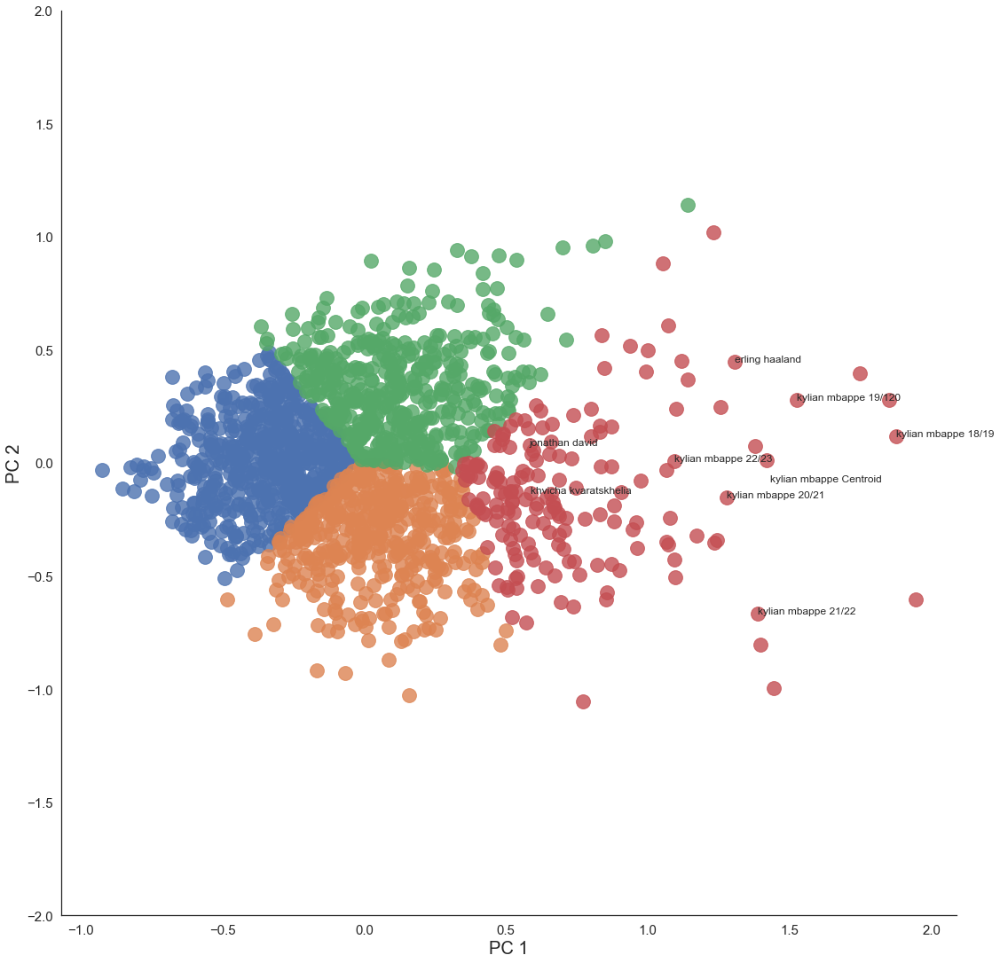

In [668]:
# Visualise the clustering, now including Mbappe data points
sns.set(style="white")
ax = sns.lmplot(x="x", y="y", hue='cluster', data = df_reduced, legend=False,
fit_reg=False, size = 15, scatter_kws={"s": 250})
texts = []
for x, y, s in zip(df_mbappe_cluster_u23.head(10).x, df_mbappe_cluster_u23.head(10).y, df_mbappe_cluster_u23.head(10).name):
    texts.append(plt.text(x, y, s))

plt.annotate("kylian mbappe 18/19", (mbappe_x_1819, mbappe_y_1819))
plt.annotate("kylian mbappe 19/120", (mbappe_x_1920, mbappe_y_1920))
plt.annotate("kylian mbappe 20/21", (mbappe_x_2021, mbappe_y_2021))
plt.annotate("kylian mbappe 21/22", (mbappe_x_2122, mbappe_y_2122))
plt.annotate("kylian mbappe 22/23", (mbappe_x_2223, mbappe_y_2223))
plt.annotate("kylian mbappe Centroid", (mbappe_x_centroid, mbappe_y_centroid))

ax.set(ylim=(-2, 2))
plt.tick_params(labelsize=15)
plt.xlabel("PC 1", fontsize = 20)
plt.ylabel("PC 2", fontsize = 20)
plt.show()

### Using GMM

In [664]:
#Closest Performing Young players (Under 25) in current season 2022-2023
# Filter the DataFrame by players in the same cluster as Mbappe
gmm_df_mbappe_cluster_u23 = gmm_df_reduced[(gmm_df_reduced['cluster'] == gmm_mbappe_cluster) & (gmm_df_reduced['age'] <= 23) & (gmm_df_reduced['season'] == '2022-2023')]

# Display the DataFrame
# df_mbappe_cluster.sort_values(by=['dist_mbappe_centroid'], ascending=True).head(10)
gmm_df_mbappe_cluster_u23[~gmm_df_mbappe_cluster_u23['name'].str.contains('kylian mbappe', case=False)].sort_values(by=['dist_mbappe_centroid'], ascending=True).head(20)
## Closest performing players in all seasons

,x,y,cluster,name,season,minutes,matches_played,matches_started,comp,team,...,pos,age,birth_year,nationality,dist_mbappe_1819,dist_mbappe_1920,dist_mbappe_2021,dist_mbappe_2122,dist_mbappe_2223,dist_mbappe_centroid
603,1.307279,0.445813,2,erling haaland,2022-2023,2022.0,25.0,24.0,Premier League,Manchester City,...,FW,22,2000,Norway,0.654419,0.276921,0.598513,1.114792,0.486807,0.542972
1584,0.587614,-0.134980,2,khvicha kvaratskhelia,2022-2023,1551.0,21.0,20.0,Serie A,Napoli,...,FW,22,2001,Georgia,1.311713,1.025357,0.690114,0.960518,0.525563,0.845955
1256,0.582418,0.080077,2,jonathan david,2022-2023,2112.0,25.0,24.0,Ligue 1,Lille,...,FW,23,2000,Canada,1.292617,0.964507,0.732807,1.098003,0.515737,0.864976


In [665]:
gmm_df_mbappe_cluster_u23.shape

(3, 21)

As per GMM there are 3 players Erling Haaland, khvicha kvaratskhelia and Jonathan David, are similar to Mbappe 

#### Visualising the results

/Users/sayedsohail/opt/anaconda3/lib/python3.9/site-packages/seaborn/regression.py:581: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


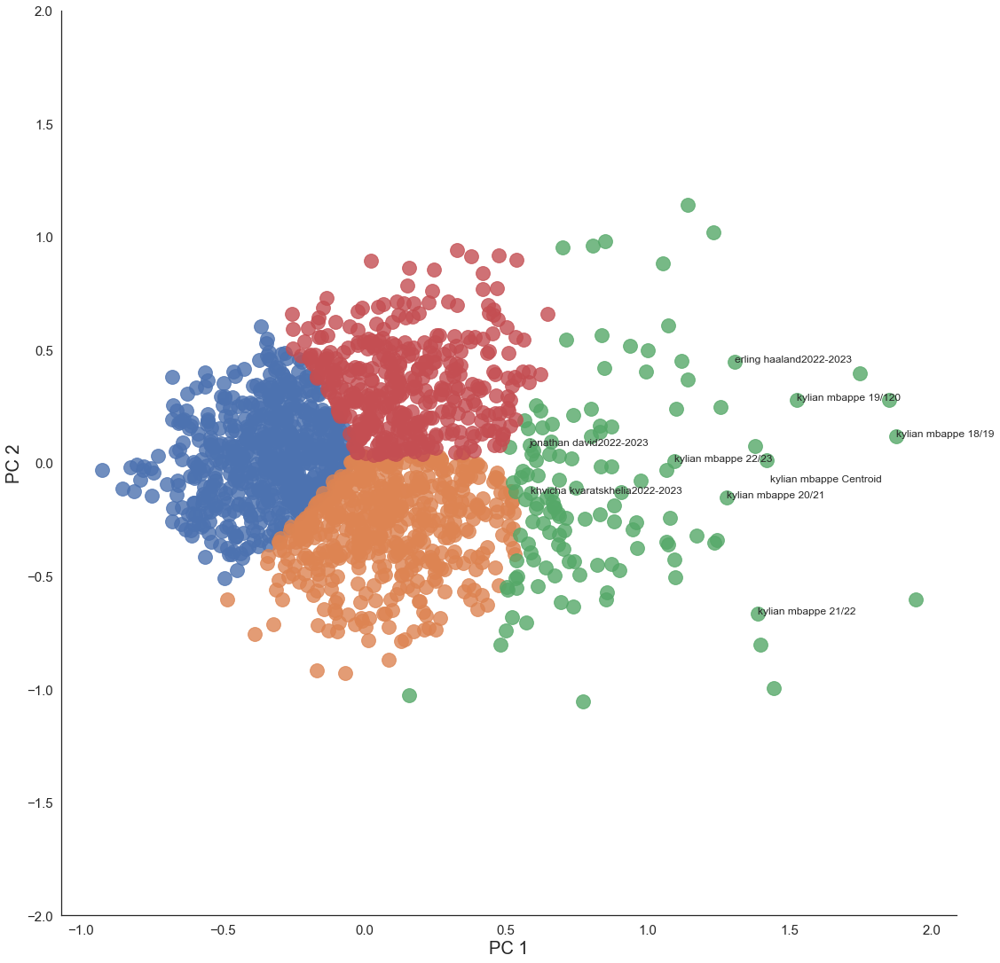

In [669]:
# Visualise the clustering, now including Mbappe data points
sns.set(style="white")
ax = sns.lmplot(x="x", y="y", hue='cluster', data = gmm_df_reduced, legend=False,
fit_reg=False, size = 15, scatter_kws={"s": 250})
texts = []
for x, y, s in zip(gmm_df_mbappe_cluster_u23.head(10).x, gmm_df_mbappe_cluster_u23.head(10).y, gmm_df_mbappe_cluster_u23.head(10).name+gmm_df_mbappe_cluster_u23.head(10).season):
    texts.append(plt.text(x, y, s))

plt.annotate("kylian mbappe 18/19", (gmm_mbappe_x_1819, gmm_mbappe_y_1819))
plt.annotate("kylian mbappe 19/120", (gmm_mbappe_x_1920, gmm_mbappe_y_1920))
plt.annotate("kylian mbappe 20/21", (gmm_mbappe_x_2021, gmm_mbappe_y_2021))
plt.annotate("kylian mbappe 21/22", (gmm_mbappe_x_2122, gmm_mbappe_y_2122))
plt.annotate("kylian mbappe 22/23", (gmm_mbappe_x_2223, gmm_mbappe_y_2223))
plt.annotate("kylian mbappe Centroid", (gmm_mbappe_x_centroid, gmm_mbappe_y_centroid))

ax.set(ylim=(-2, 2))
plt.tick_params(labelsize=15)
plt.xlabel("PC 1", fontsize = 20)
plt.ylabel("PC 2", fontsize = 20)
plt.show()

<a id='section8'></a>

## <a id='#section8'>8. Conclusion


The outcome of this analysis was to identify players similar to Kylian Mbappe over past 5 seasons across top 5 European Football Leagues.

- We found that Erling Haaland, khvicha kvaratskhelia and Jonathan David are young players under 23 that have similar performances this season(2022-2023).
- Top 5 Players  Lionel Messi, Robert Lewandowski, Erling Haaland, victor osimhen and wissam ben yedder are perfoming smiliar to Mbappe this season(2022-2023).
- Top 5 players over the five seasons 2018-2019 with similar performances like Mbappe are: 
    - robert lewandowski (2019-2020)
    - robert lewandowski (2021-2022)
    - timo werner	(2019-2020)
    - karim benzema	(2021-2022)
    - ciro immobile	(2019-2020)
    - andre silva	(2020-2021)
- Over Past 5 seasons K-Means algorithm clustered 174 players and GMM 128 Players into Mbappe's cluster.
- In 2022-2023 season, As per GMM 14 players have similar performances to Mbappe.
- In 2022-2023 season, As per K-Means 13 players have similar performances to Mbappe.




<a id='section9'></a>

## <a id='#section9'>9. Future Improvements or Directions


- The notebook could be enhanced to inculde tranfer data and could be used in player recruitment, by comparing stats from similar players and use it to recruit next best players for the club. The player vaulation model could be used to estimate player's market value. 
- This code currently mesures proximity to clusters but can be cinverted to percentage score to find how similar a player is to the comparison player
- Implement other clustering algorithms like DBSCAN and Hierarchical Clustering.
- Improve the identification of the characteristics that influence Mbappe's playing style. Currently, the model simplifies the selected performance metrics into two dimensions, which are chosen arbitrarily for visualization purposes. It doesn't explain why a player is achieving results similar to Mbappe's, only that they belong to the same cluster and are in close proximity.